In [140]:
import os


import matplotlib.pyplot as plt
import pertpy as pt
from seaborn import clustermap

import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc

from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import linkage

In [145]:
INPUT_DIR = "inputs/anndatas"

adata = sc.read_h5ad(
    os.path.join(INPUT_DIR, "omentum_reannotated_finely.h5ad"))

# Omentum

In [38]:
adata.X.sum(axis=1)

matrix([[ 2202.],
        [ 7881.],
        [ 9092.],
        ...,
        [15208.],
        [ 9088.],
        [ 5415.]], shape=(25830, 1), dtype=float32)

## Manual PB

In [37]:
# adata.X = adata.layers["counts"].copy()

In [14]:
X = np.zeros((adata_pb.obs["participant"].nunique(), adata_pb.shape[1]), dtype=np.float32)
cols = ["cohort", "sex"]

obs_vals = {}
obs_names = []

for i, (participant, samples) in enumerate(adata_pb.obs.groupby("participant", observed=True)):
    samples_X = adata_pb[samples.index,:].X
    X[i] = samples_X.sum(axis=0)
    obs_vals[participant] = {col: samples[col].iloc[0] for col in cols}
    obs_names.append(participant)

In [15]:
adata_pb_total = ad.AnnData(X)
adata_pb_total.obs_names = obs_names
adata_pb_total.var_names = adata_pb.var_names

adata_pb_total.obs = pd.DataFrame.from_dict(obs_vals, orient="index").loc[obs_names,:]

In [20]:
adata_pb_total.obs

,cohort,sex
Omentum_Healthy_0,Healthy,F
Omentum_Healthy_1,Healthy,F
Omentum_Healthy_2,Healthy,M
Omentum_Healthy_3,Healthy,M
Omentum_Healthy_4,Healthy,F
Omentum_Unhealthy_0,Unhealthy,F
Omentum_Unhealthy_1,Unhealthy,F
Omentum_Unhealthy_2,Unhealthy,M
Omentum_Unhealthy_3,Unhealthy,M
Omentum_Unhealthy_4,Unhealthy,F


## by total PB

In [39]:
obs_key = "participant"  # defines groups to test

In [41]:
adata.obs.value_counts(obs_key)

participant
Omentum_Healthy_1      3769
Omentum_Healthy_2      3722
Omentum_Healthy_0      3563
Omentum_Healthy_3      2790
Omentum_Unhealthy_1    2562
Omentum_Unhealthy_2    2342
Omentum_Unhealthy_3    2240
Omentum_Unhealthy_0    2124
Omentum_Unhealthy_4    1988
Omentum_Healthy_4       730
Name: count, dtype: int64

In [45]:
adata.X.sum(axis=1)

matrix([[1371.8314],
        [1858.3596],
        [1981.1871],
        ...,
        [1930.5717],
        [2066.3462],
        [1515.7266]], shape=(25830, 1), dtype=float32)

### Energy distance

In [46]:
distance = pt.tl.Distance("edistance", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [49]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in  df.index]

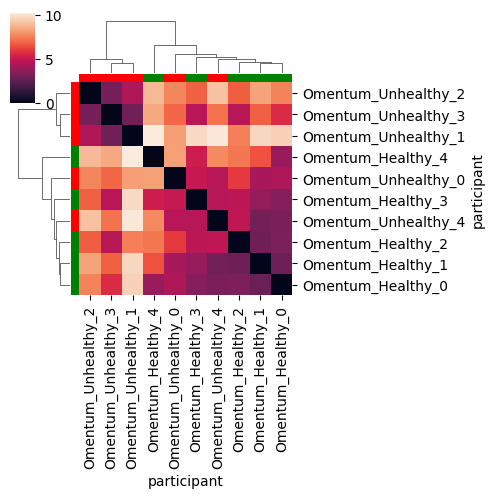

In [55]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage, col_linkage=linkage)
plt.show()

### Eucledian distance

In [56]:
distance = pt.tl.Distance("euclidean", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [57]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in  df.index]

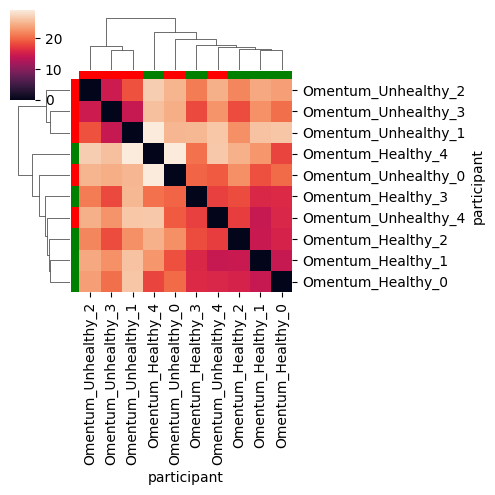

In [60]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

### Mean pairwise distance

In [61]:
distance = pt.tl.Distance("mean_pairwise", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [62]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

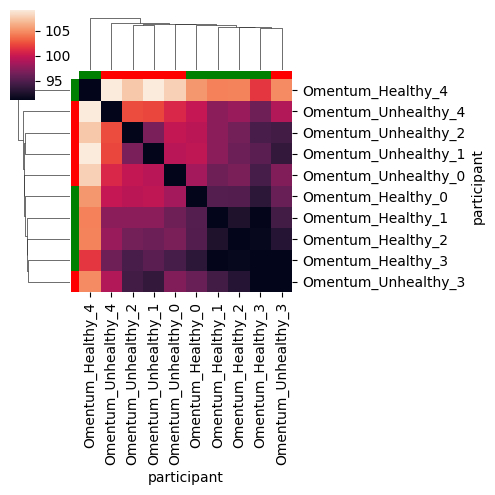

In [64]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

values = np.ravel(df.values)
nonzero = values[values != 0]
vmin = np.min(nonzero)

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
plt.show()

### Wasserstein distance

In [65]:
distance = pt.tl.Distance("wasserstein", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [66]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

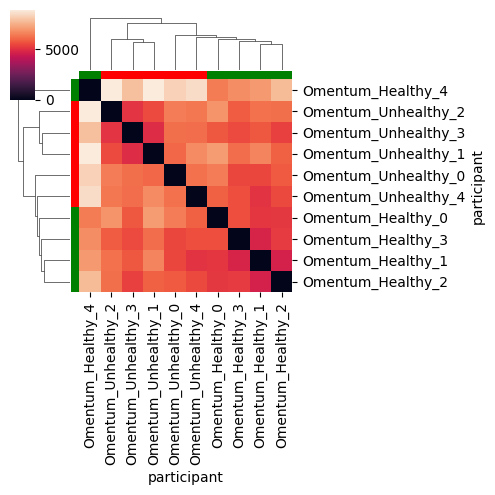

In [67]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

### MMD

In [68]:
distance = pt.tl.Distance("mmd", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [69]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in  df.index]

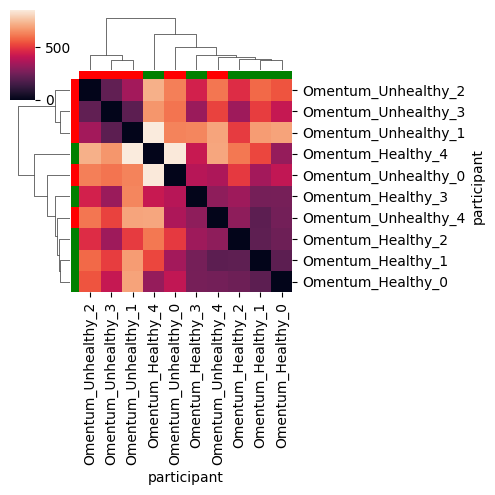

In [70]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

### ks_test

In [75]:
distance = pt.tl.Distance("ks_test", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [76]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in  df.index]

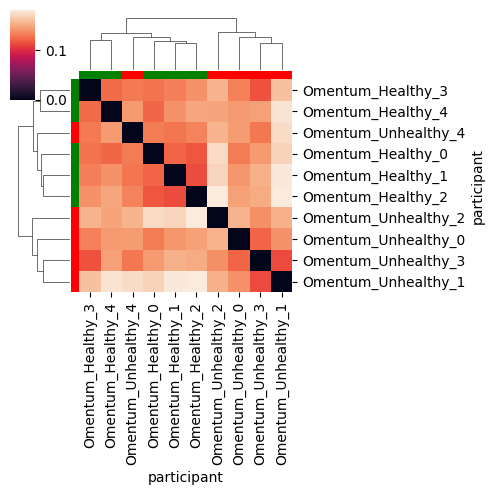

In [77]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

### classifier_proba

In [81]:
distance = pt.tl.Distance("classifier_proba", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key, max_iter=1000, )

Output()

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning:
lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(

In [82]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in  df.index]

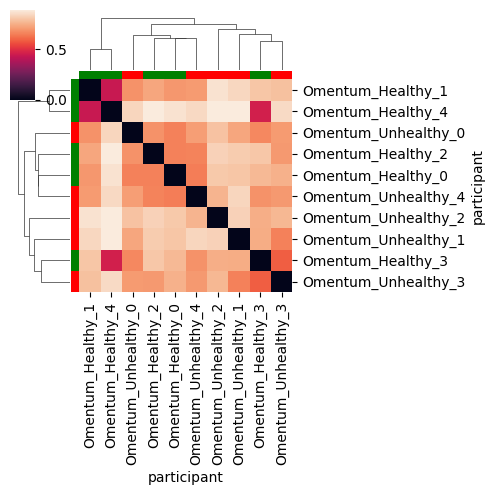

In [83]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

## by cell-type PB

In [144]:
cell_type_col = "cell_type"

In [146]:
adata.obs["cell_type.participant"] = adata.obs[cell_type_col].astype(str) + "." + adata.obs["participant"].astype("str")

adata.obs["cell_type.participant"] = pd.Categorical(adata.obs["cell_type.participant"])

In [147]:
obs_key = "cell_type.participant"  # defines groups to test

In [148]:
adata.obs.value_counts(obs_key)

cell_type.participant
FAPs.Omentum_Healthy_1               1407
FAPs.Omentum_Healthy_0               1133
Mesothelial.Omentum_Unhealthy_1      1128
FAPs.Omentum_Healthy_2                989
Mesothelial.Omentum_Healthy_2         915
                                     ... 
Plasma cells.Omentum_Unhealthy_4        3
Plasma cells.Omentum_Healthy_1          3
IGFBP2+ cells.Omentum_Unhealthy_0       2
Plasma cells.Omentum_Healthy_3          2
Mesothelial.Omentum_Healthy_4           1
Name: count, Length: 107, dtype: int64

In [149]:
adata.X.sum(axis=1)

matrix([[1371.8314],
        [1858.3596],
        [1981.1871],
        ...,
        [1930.5717],
        [2066.3462],
        [1515.7266]], shape=(25830, 1), dtype=float32)

### Energy distance

In [150]:
distance = pt.tl.Distance("edistance", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [151]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [152]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [153]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'T cells.Omentum_Unhealthy_1', 'T cells.Omentum_Unhealthy_2', 'T cells.Omentum_Unhealthy_3', 'T cells.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [154]:
df = (df + df.T) / 2

In [155]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

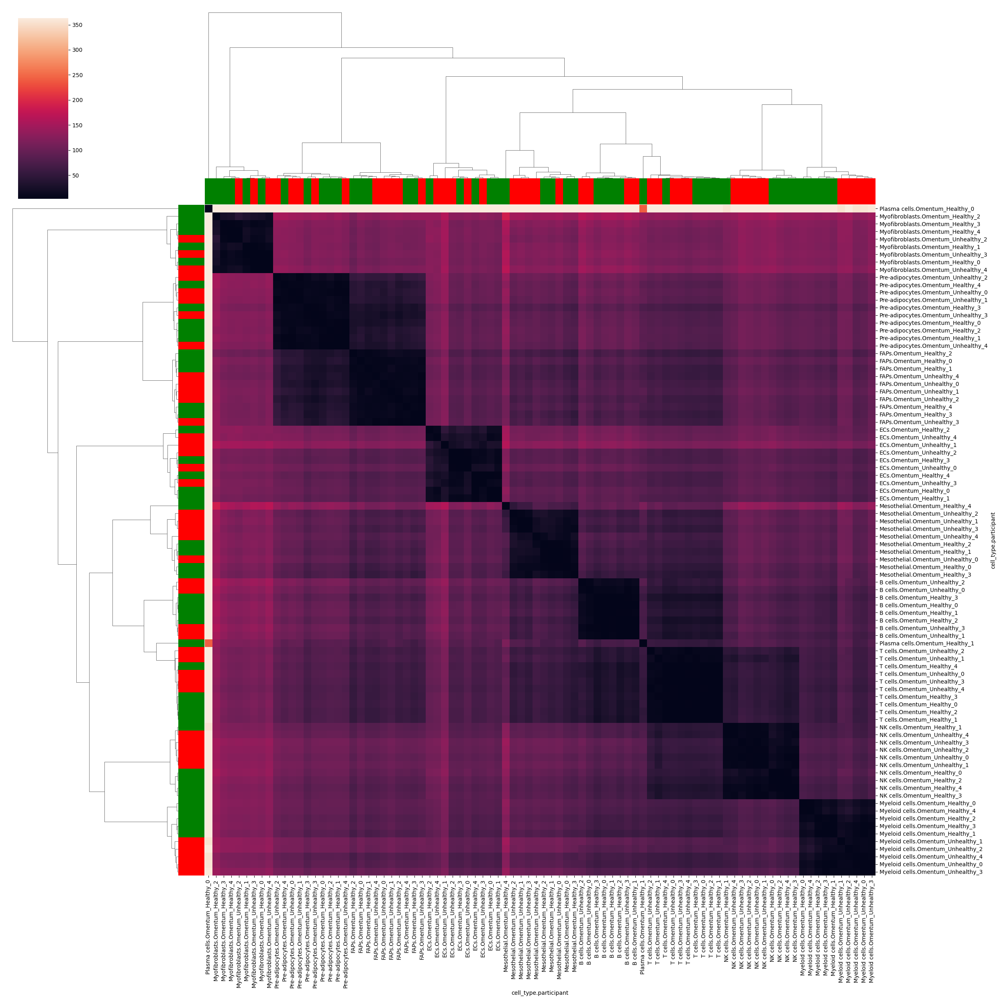

In [156]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(25, 25), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

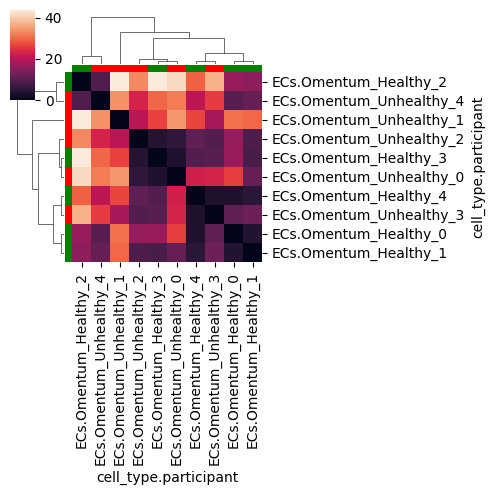

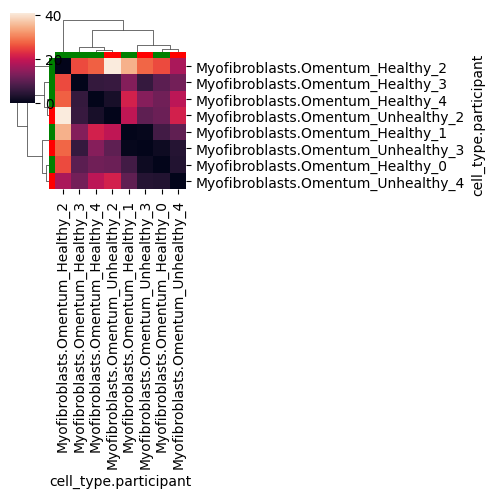

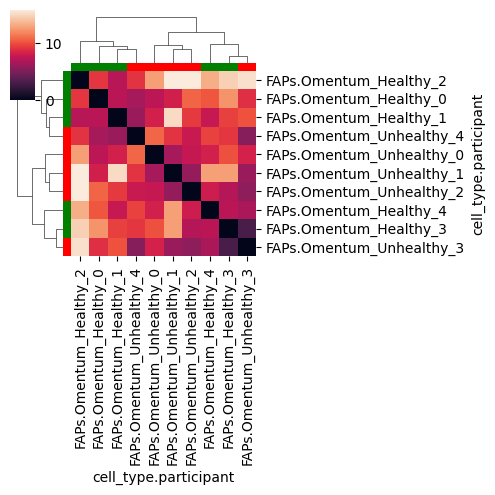

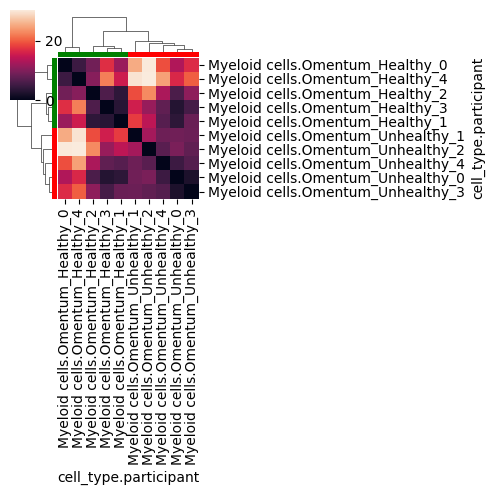

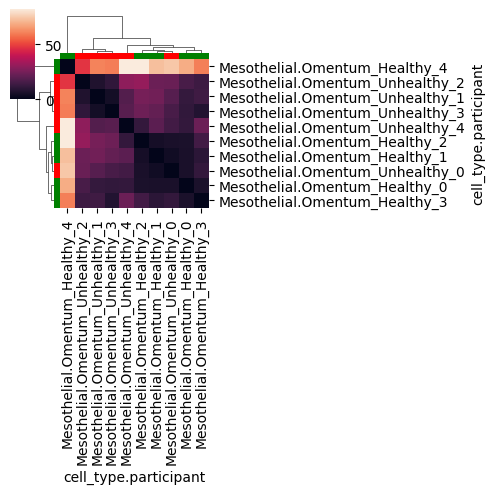

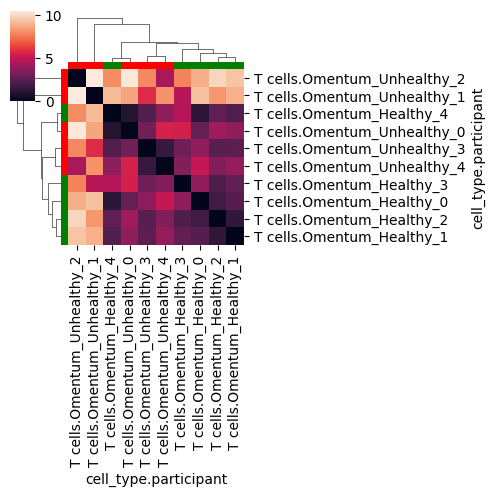

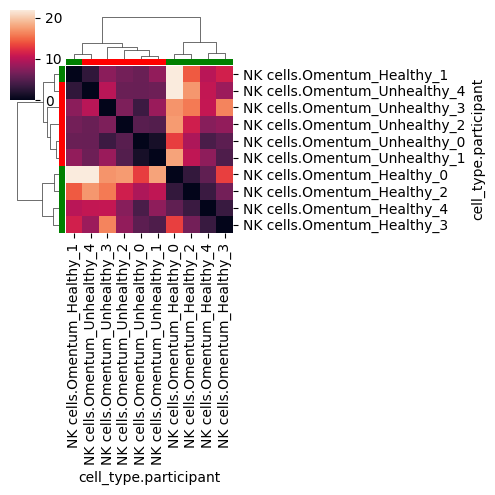

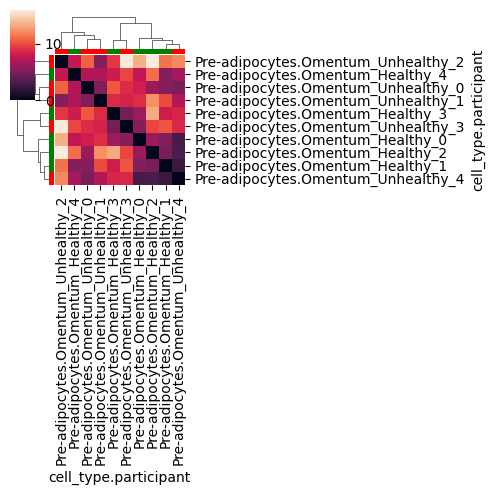

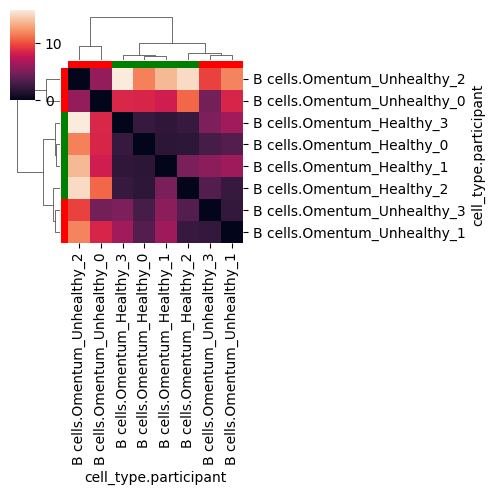

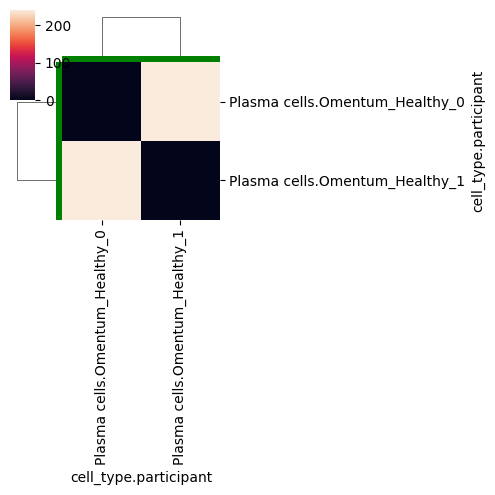

In [163]:
for ct in adata.obs[cell_type_col].unique():
    ct_pbs = [ct_pb for ct_pb in df.index if ct_pb.find(ct) != -1]
    if not len(ct_pbs):
        continue
    df_ct = df.loc[ct_pbs, ct_pbs]

    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### Eucledian distance

In [164]:
distance = pt.tl.Distance("euclidean", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [165]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [166]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [167]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'T cells.Omentum_Unhealthy_1', 'T cells.Omentum_Unhealthy_2', 'T cells.Omentum_Unhealthy_3', 'T cells.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [168]:
df = (df + df.T) / 2

In [169]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

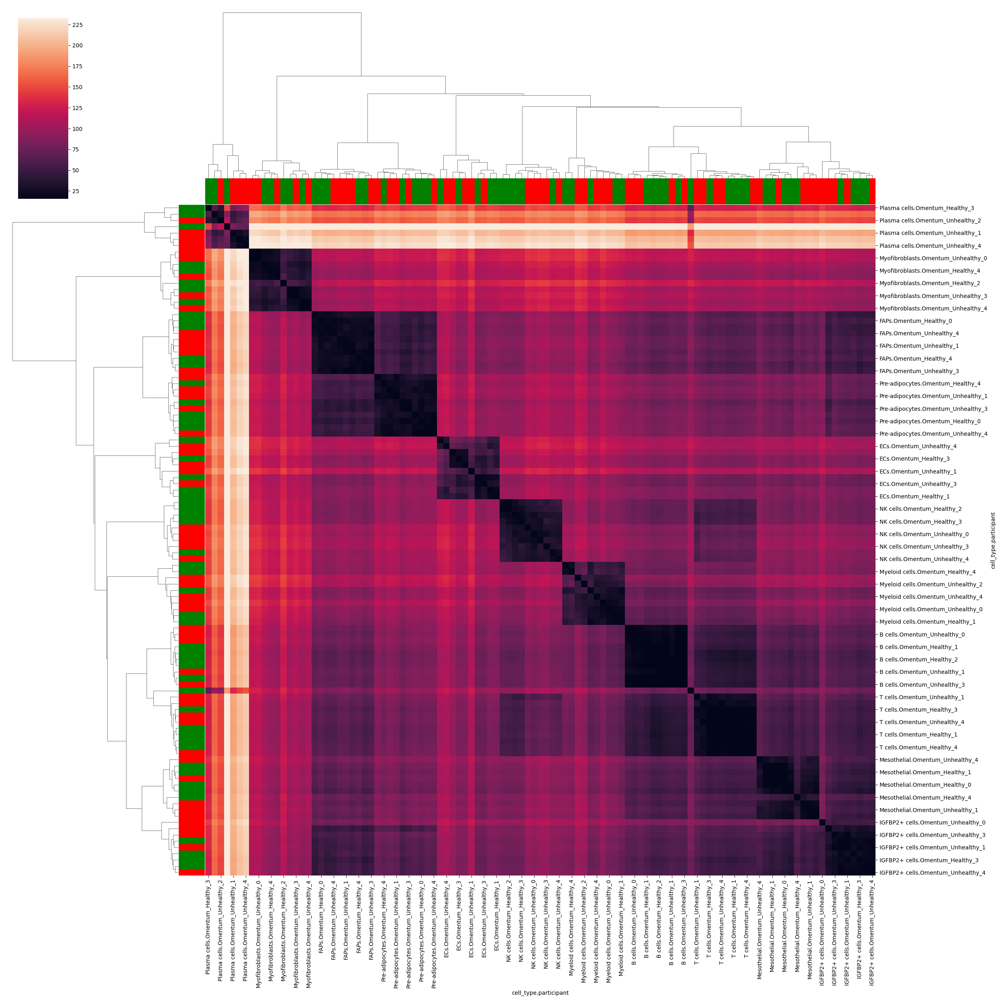

In [170]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

clustermap(df, robust=True, figsize=(25, 25), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
plt.show()

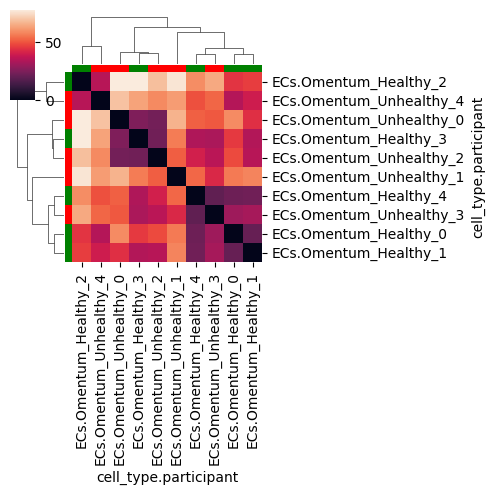

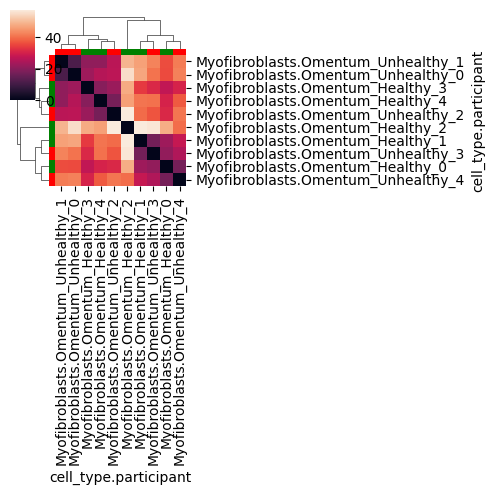

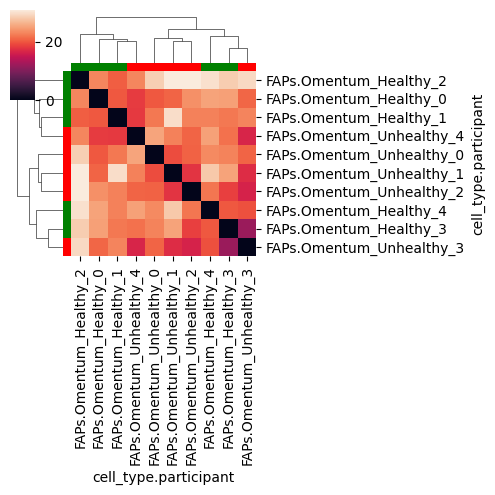

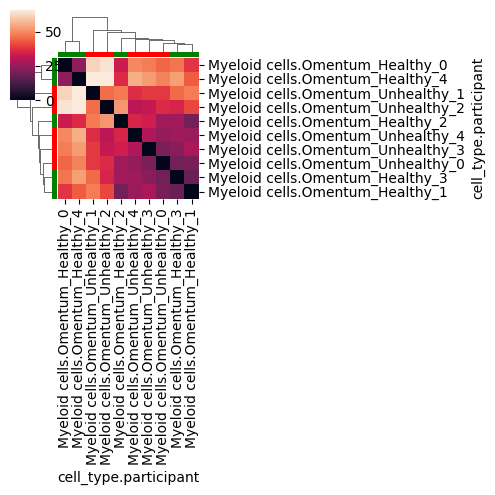

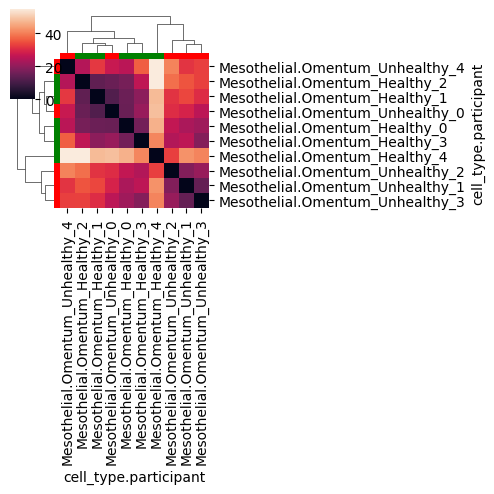

...

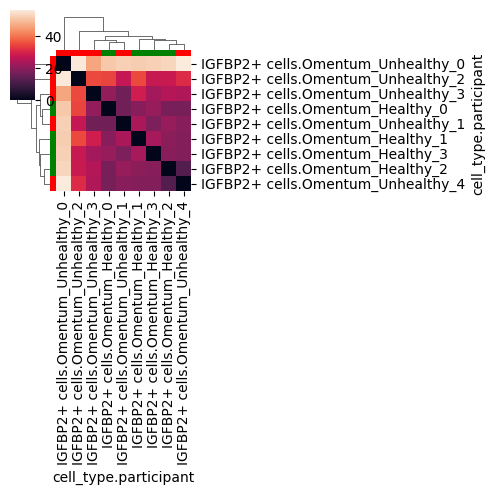

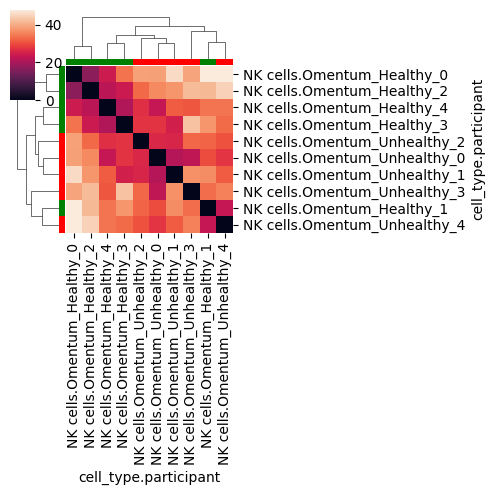

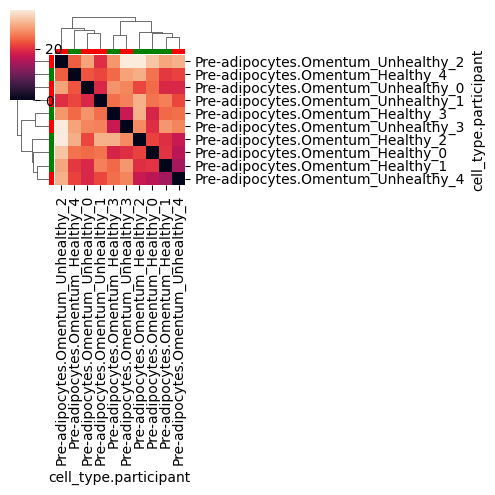

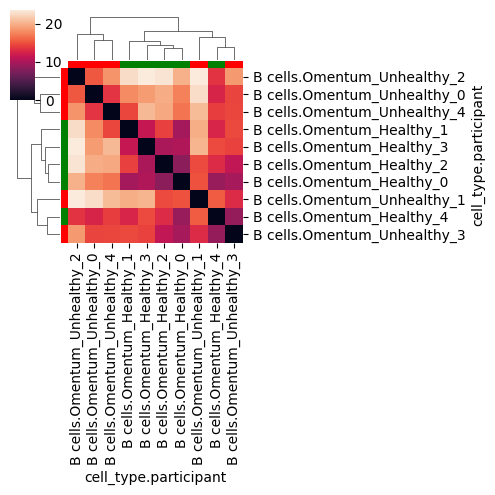

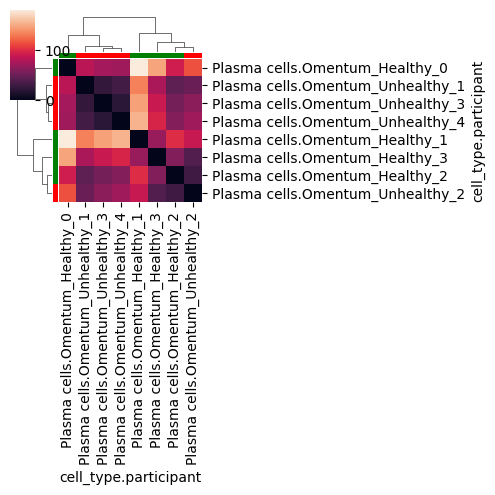

In [171]:
for ct in adata.obs[cell_type_col].unique():
    ct_pbs = [ct_pb for ct_pb in df.index if ct_pb.find(ct) != -1]
    if not len(ct_pbs):
        continue
    df_ct = df.loc[ct_pbs, ct_pbs]

    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### Mean pairwise distance

In [172]:
distance = pt.tl.Distance("mean_pairwise", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [175]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [176]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [177]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'T cells.Omentum_Unhealthy_1', 'T cells.Omentum_Unhealthy_2', 'T cells.Omentum_Unhealthy_3', 'T cells.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [178]:
df = (df + df.T) / 2

In [186]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

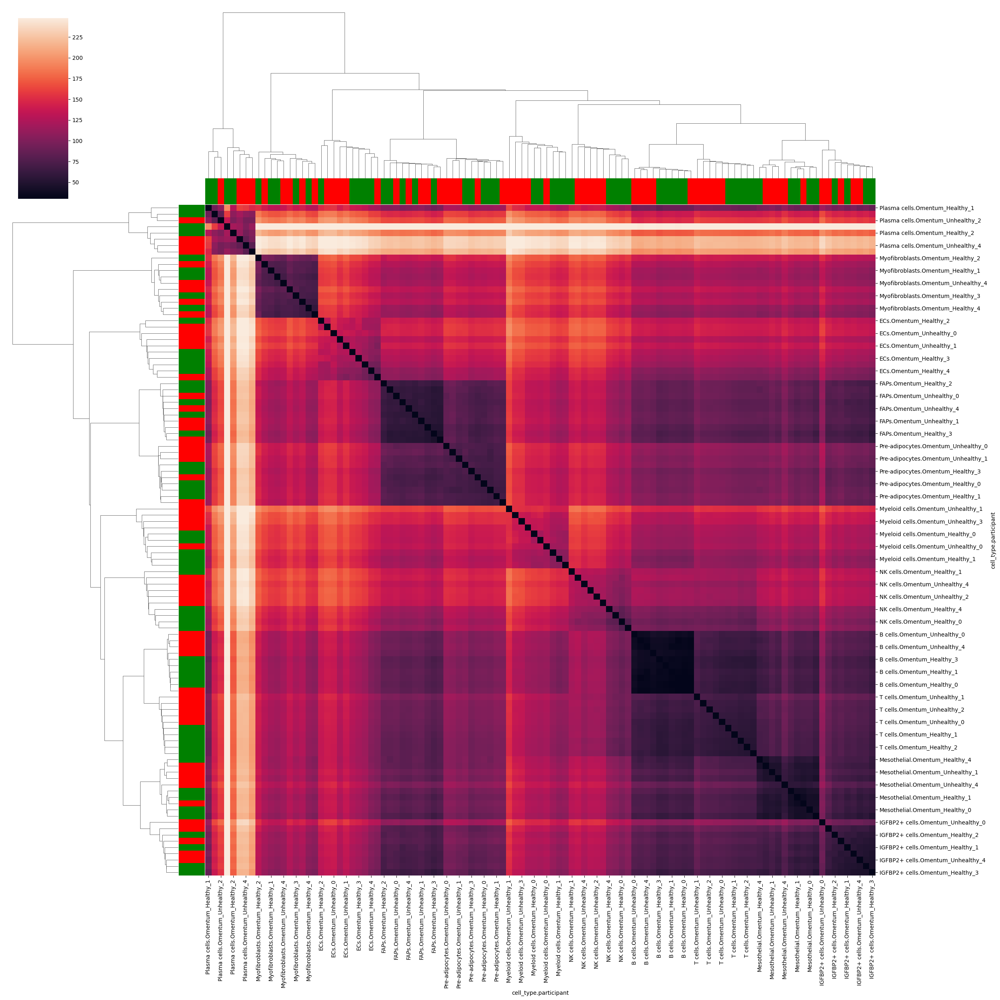

In [187]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

values = np.ravel(df.values)
nonzero = values[values != 0]
vmin = np.min(nonzero)

clustermap(df, robust=True, figsize=(25, 25), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
plt.show()

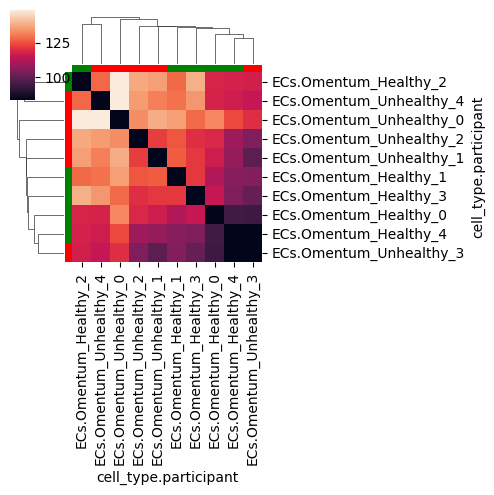

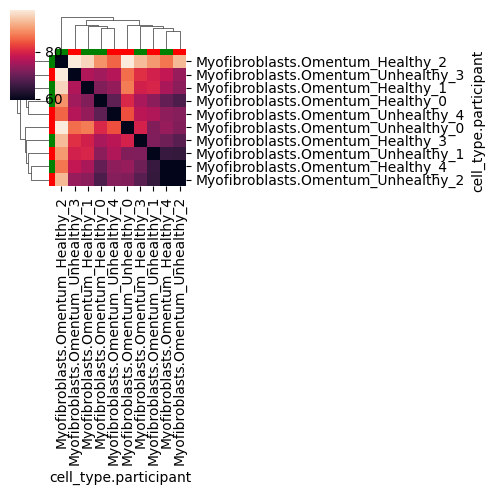

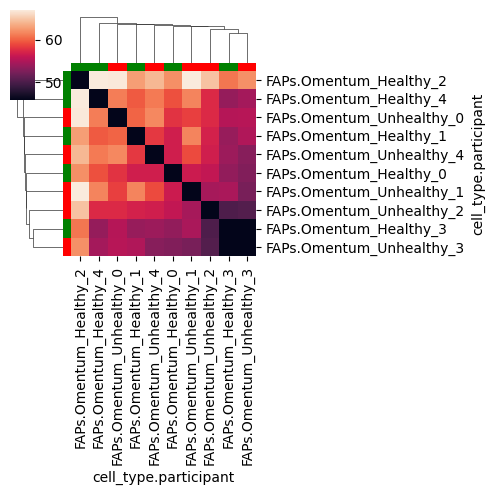

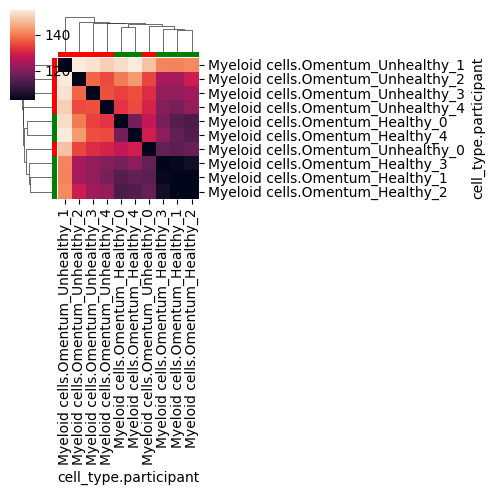

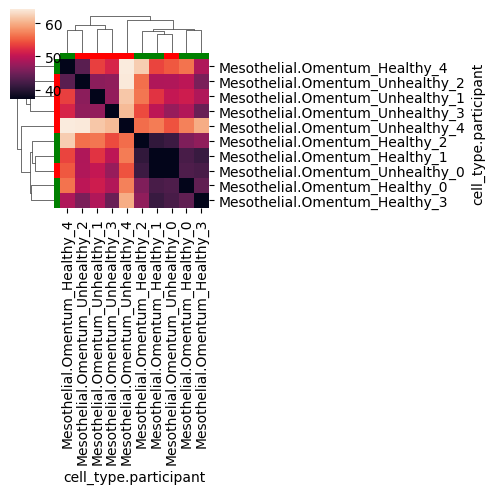

...

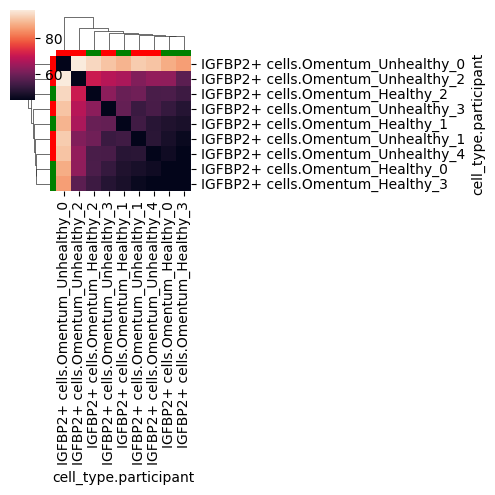

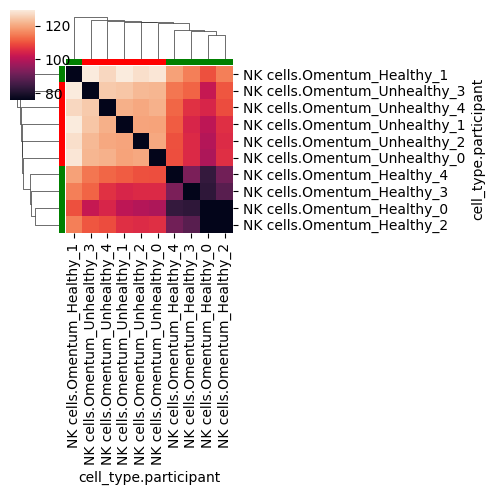

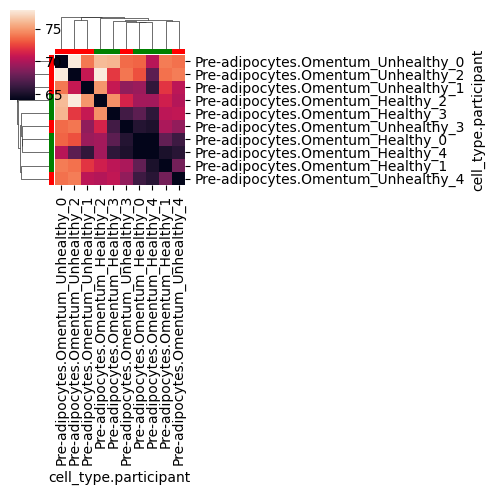

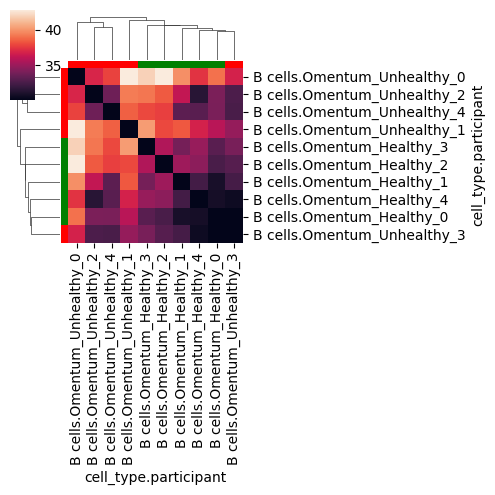

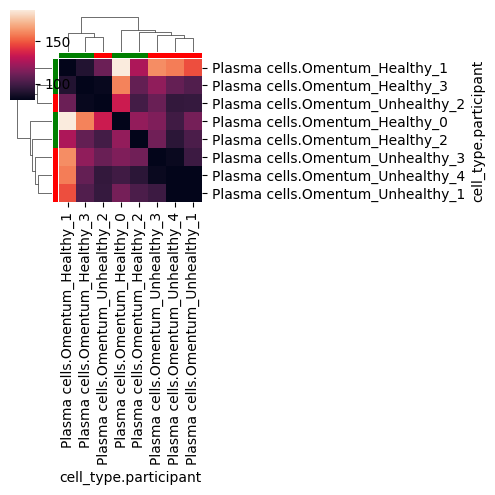

In [188]:
for ct in adata.obs[cell_type_col].unique():
    ct_pbs = [ct_pb for ct_pb in df.index if ct_pb.find(ct) != -1]
    if not len(ct_pbs):
        continue
    df_ct = df.loc[ct_pbs, ct_pbs]

    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    values = np.ravel(df_ct.values)
    nonzero = values[values != 0]
    vmin = np.min(nonzero)
    
    clustermap(df_ct, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
    plt.show()

### MMD

In [189]:
distance = pt.tl.Distance("mmd", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [190]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [191]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [192]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'T cells.Omentum_Unhealthy_1', 'T cells.Omentum_Unhealthy_2', 'T cells.Omentum_Unhealthy_3', 'T cells.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [193]:
df = (df + df.T) / 2

In [194]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

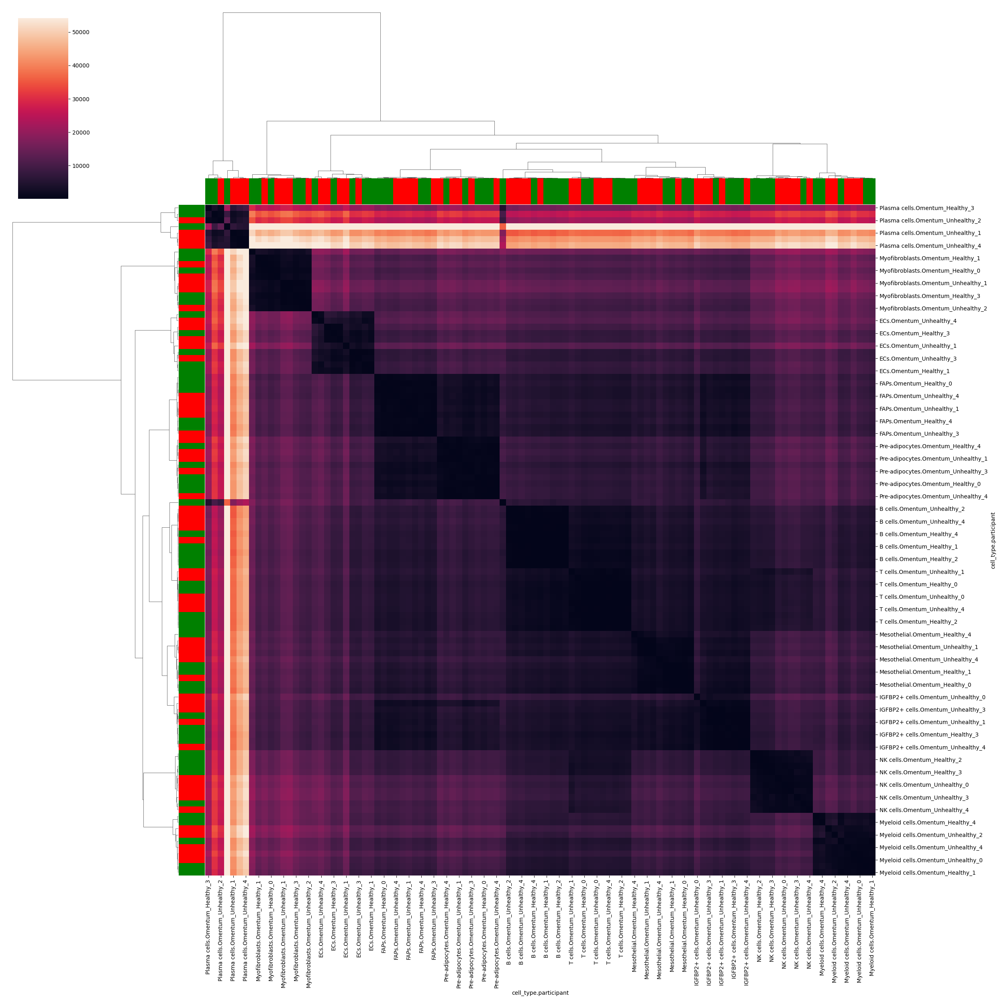

In [195]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

values = np.ravel(df.values)
nonzero = values[values != 0]
vmin = np.min(nonzero)

clustermap(df, robust=True, figsize=(25, 25), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
plt.show()

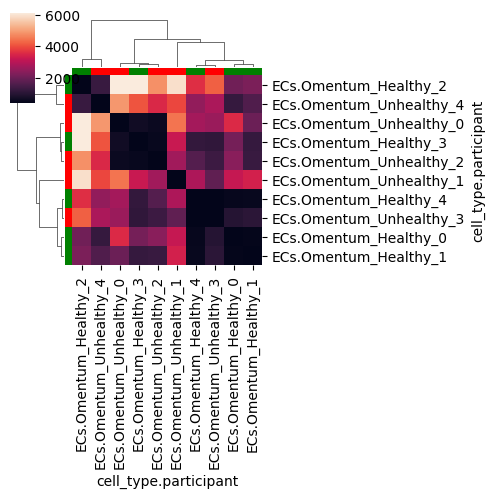

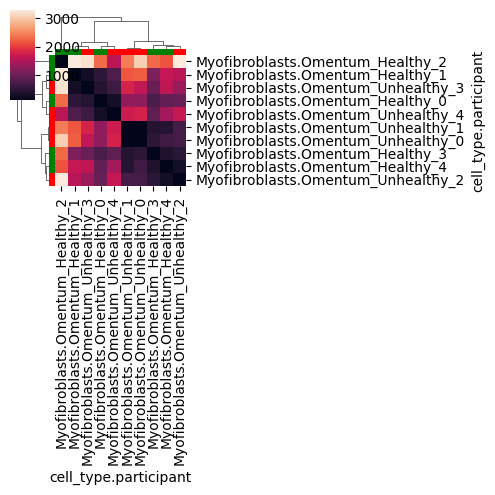

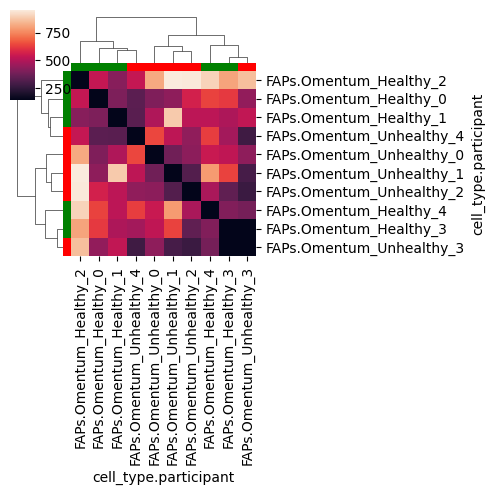

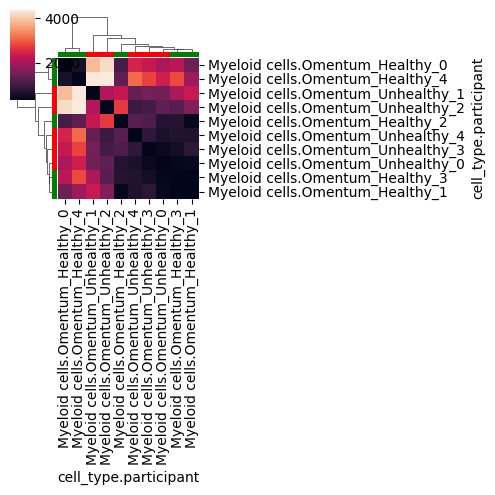

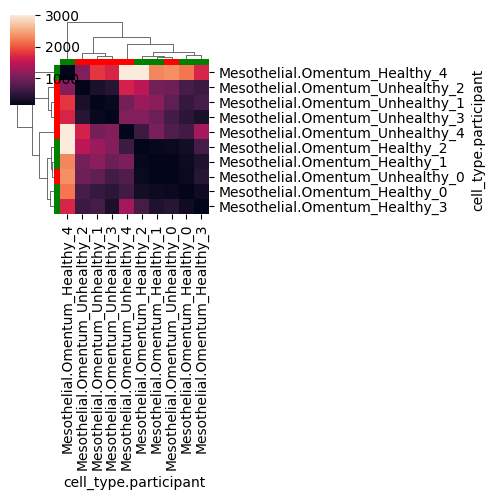

...

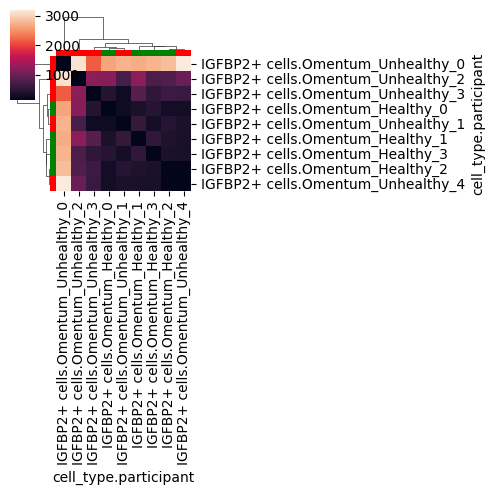

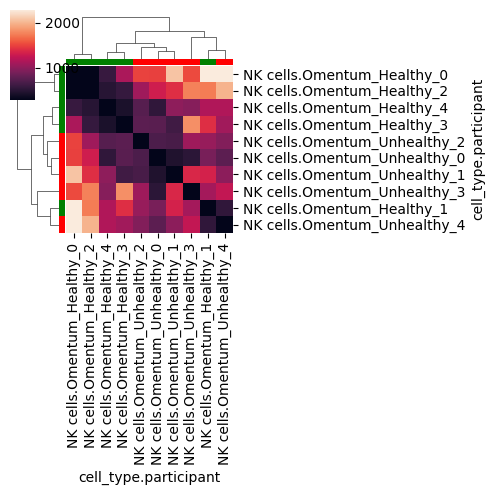

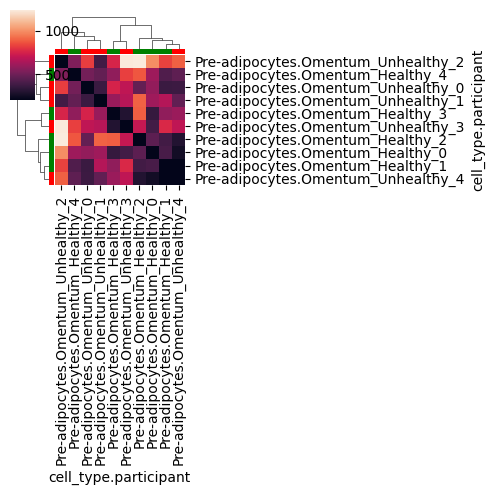

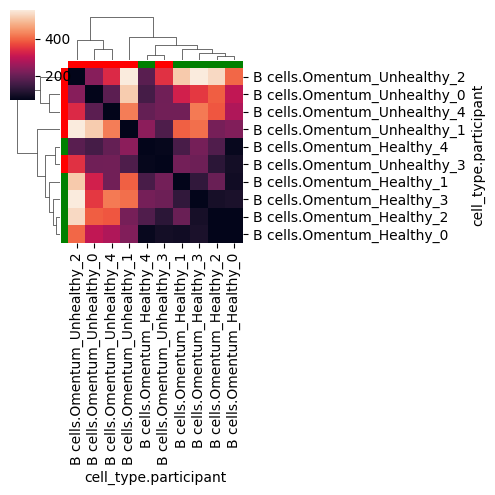

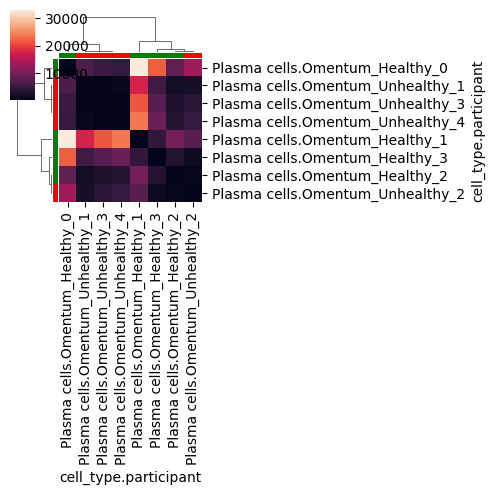

In [196]:
for ct in adata.obs[cell_type_col].unique():
    ct_pbs = [ct_pb for ct_pb in df.index if ct_pb.find(ct) != -1]
    if not len(ct_pbs):
        continue
    df_ct = df.loc[ct_pbs, ct_pbs]

    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    values = np.ravel(df_ct.values)
    nonzero = values[values != 0]
    vmin = np.min(nonzero)
    
    clustermap(df_ct, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
    plt.show()

### ks_test

In [197]:
distance = pt.tl.Distance("ks_test", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:430: RuntimeWarning: 
ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return hypotest_fun_in(*args, **kwds)

In [198]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [199]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [200]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'T cells.Omentum_Unhealthy_1', 'T cells.Omentum_Unhealthy_2', 'T cells.Omentum_Unhealthy_3', 'T cells.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [201]:
df = (df + df.T) / 2

In [202]:
lut = dict(zip(adata.obs.cohort.unique(), "gr"))
row_colors = [lut[participant.split("_")[1]] for participant in df.index]

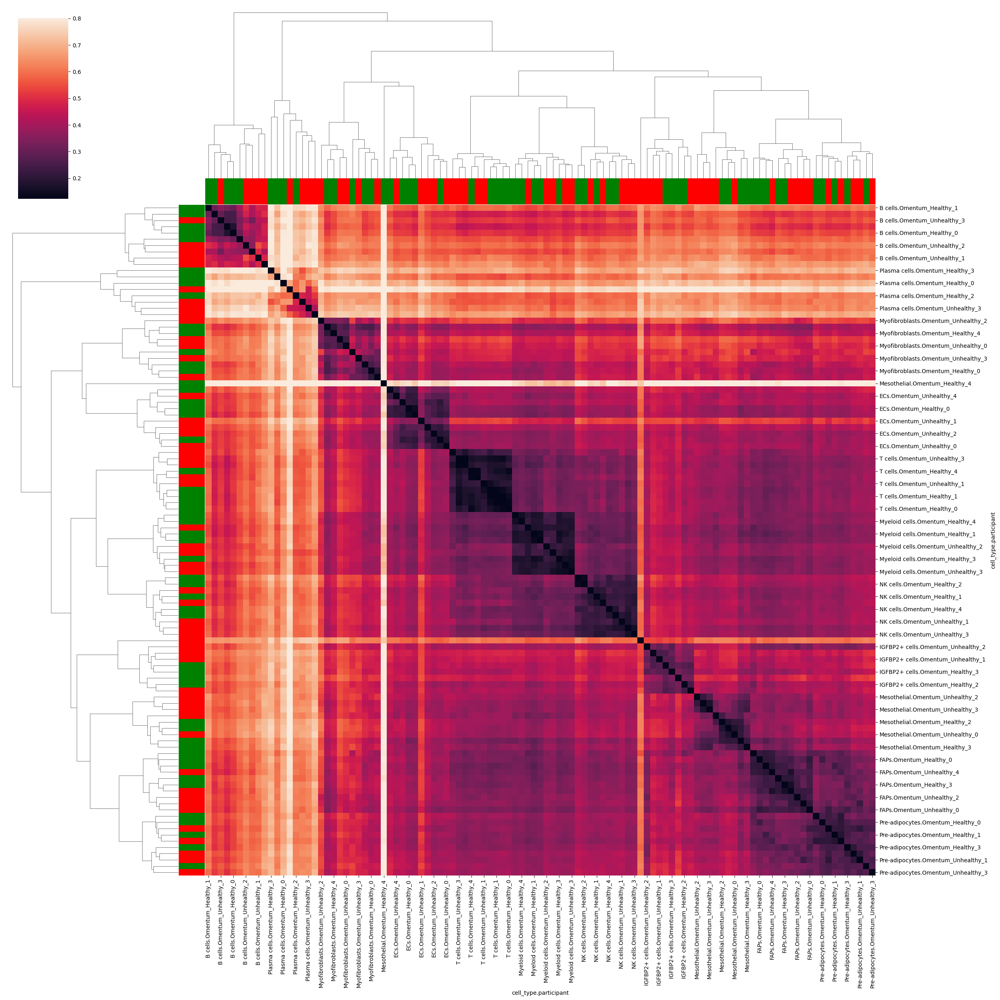

In [203]:
# Convert square distance matrix to condensed form
condensed_matrix = squareform(df)
linkage_ = linkage(condensed_matrix, method='ward')

values = np.ravel(df.values)
nonzero = values[values != 0]
vmin = np.min(nonzero)

clustermap(df, robust=True, figsize=(25, 25), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
plt.show()

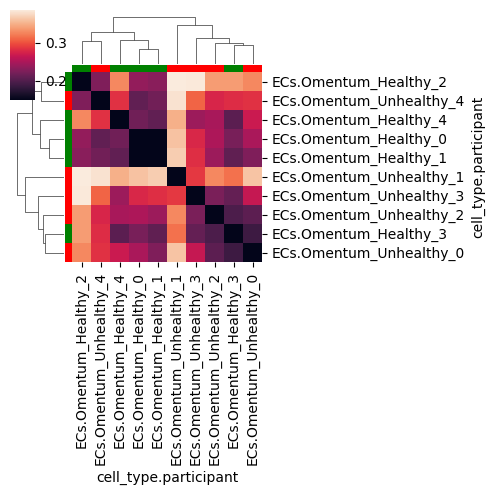

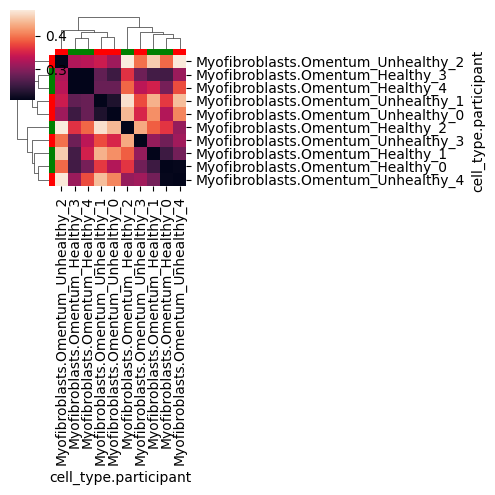

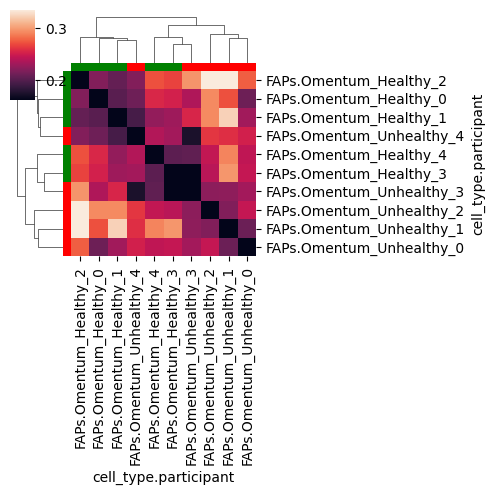

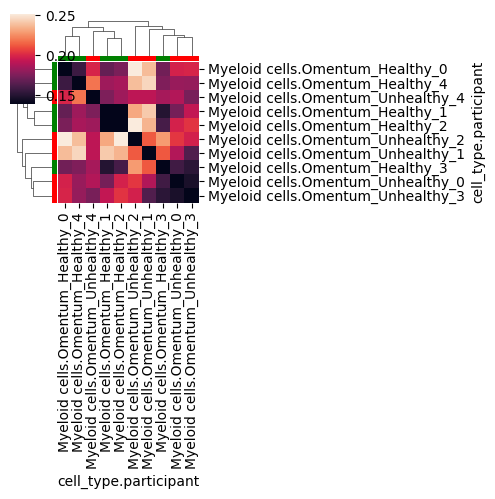

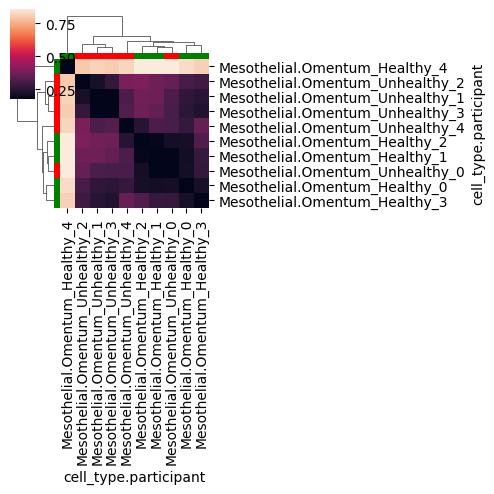

...

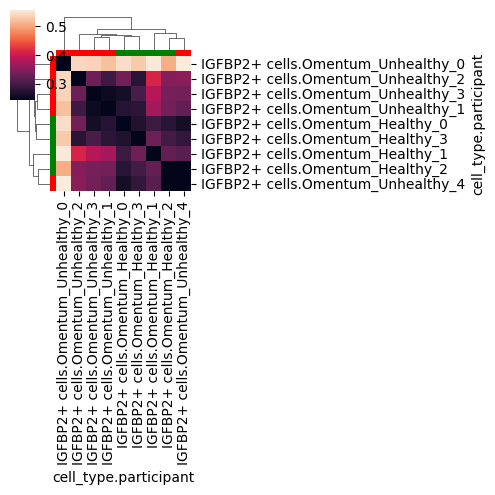

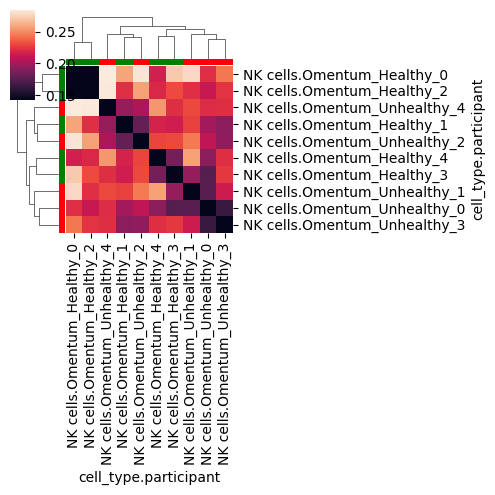

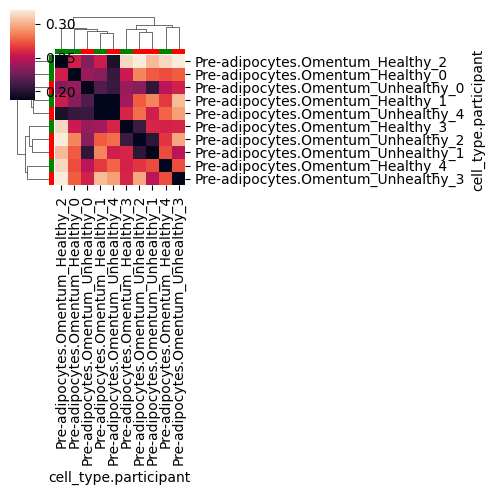

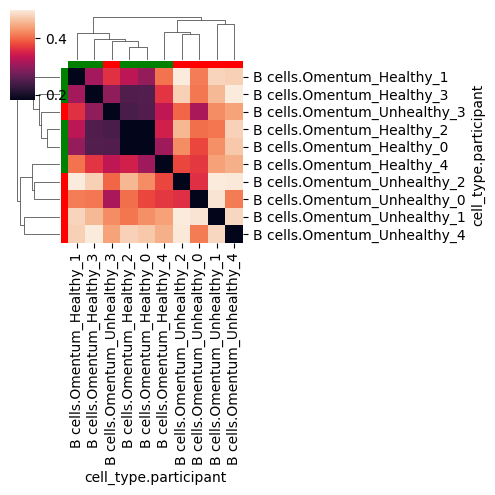

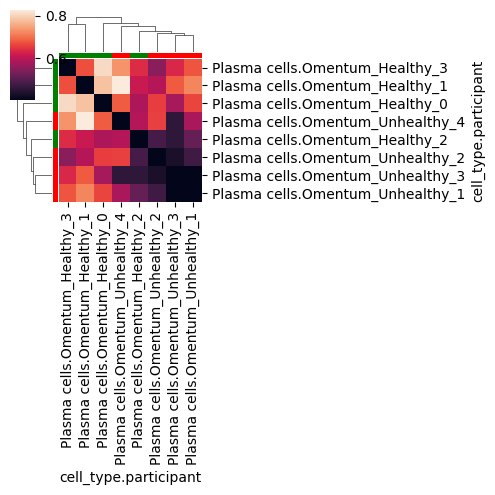

In [204]:
for ct in adata.obs[cell_type_col].unique():
    ct_pbs = [ct_pb for ct_pb in df.index if ct_pb.find(ct) != -1]
    if not len(ct_pbs):
        continue
    df_ct = df.loc[ct_pbs, ct_pbs]

    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    values = np.ravel(df_ct.values)
    nonzero = values[values != 0]
    vmin = np.min(nonzero)
    
    clustermap(df_ct, robust=True, figsize=(5, 5), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_, vmin=vmin)
    plt.show()

## by cell-type2 PB

In [206]:
cell_type_col = "cell_type2"

adata.obs[cell_type_col] = adata.obs["cell_type1"]

In [225]:
cell_types_to_rename = {
    "CD9+ ATM": "Macrophages",
    "LAMs": "Macrophages",
    "PVMs": "Macrophages",
}
for cell_type, new_cell_type in cell_types_to_rename.items():
    if new_cell_type not in adata.obs[cell_type_col].cat.categories:
        adata.obs[cell_type_col] = adata.obs[cell_type_col].cat.add_categories(
            [new_cell_type]
        )
    adata.obs.loc[adata.obs[cell_type_col] == cell_type, cell_type_col] = (
        new_cell_type
    )

In [226]:
adata.obs["cell_type.participant"] = adata.obs[cell_type_col].astype(str) + "." + adata.obs["participant"].astype("str")

adata.obs["cell_type.participant"] = pd.Categorical(adata.obs["cell_type.participant"])

In [227]:
obs_key = "cell_type.participant"  # defines groups to test

### Energy distance

In [228]:
distance = pt.tl.Distance("edistance", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [229]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [230]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [231]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'pDCs.Omentum_Unhealthy_1', 'pDCs.Omentum_Unhealthy_2', 'pDCs.Omentum_Unhealthy_3', 'pDCs.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [232]:
df = (df + df.T) / 2

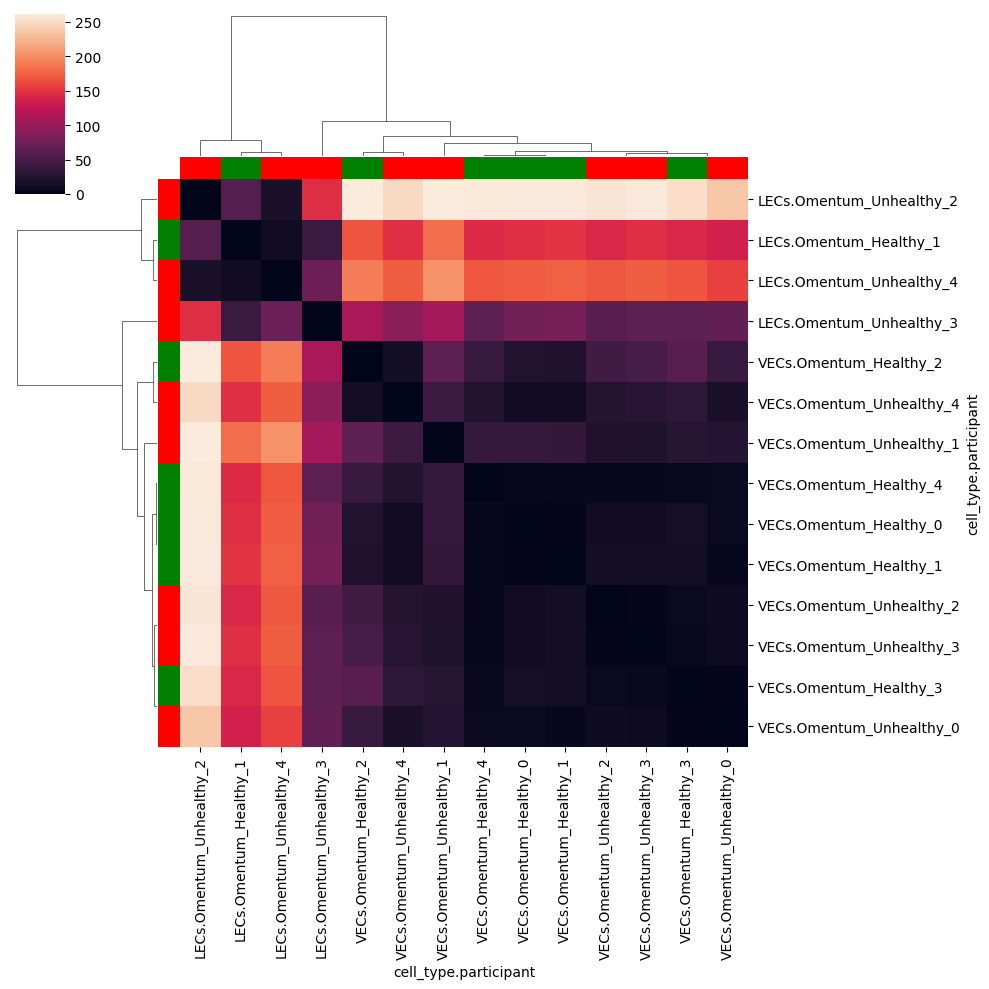

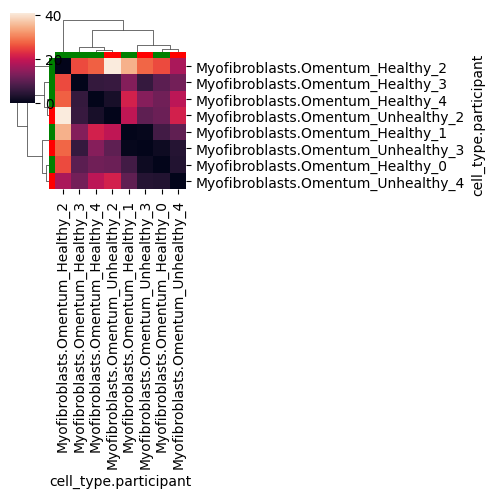

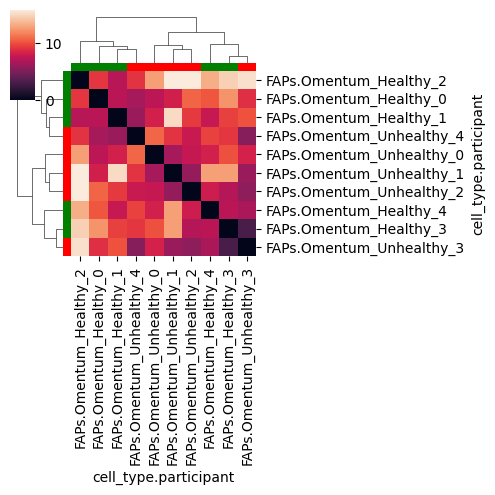

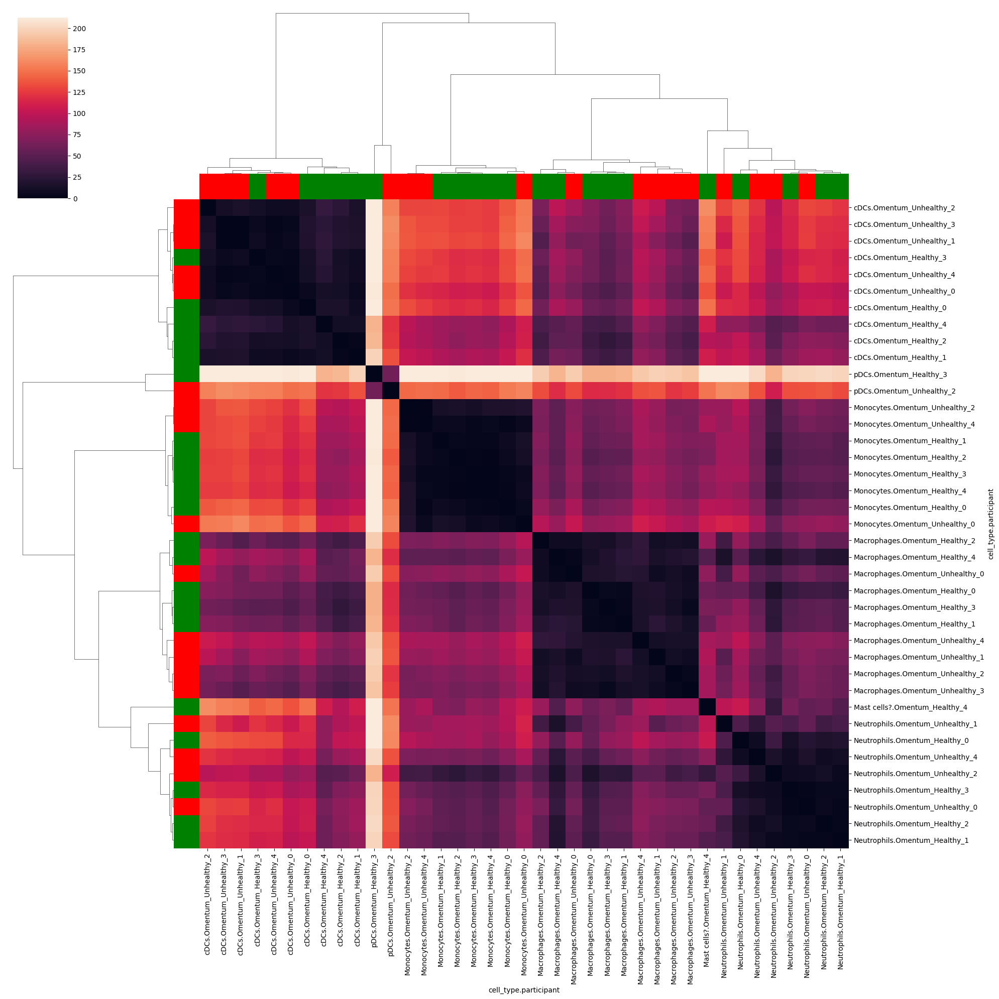

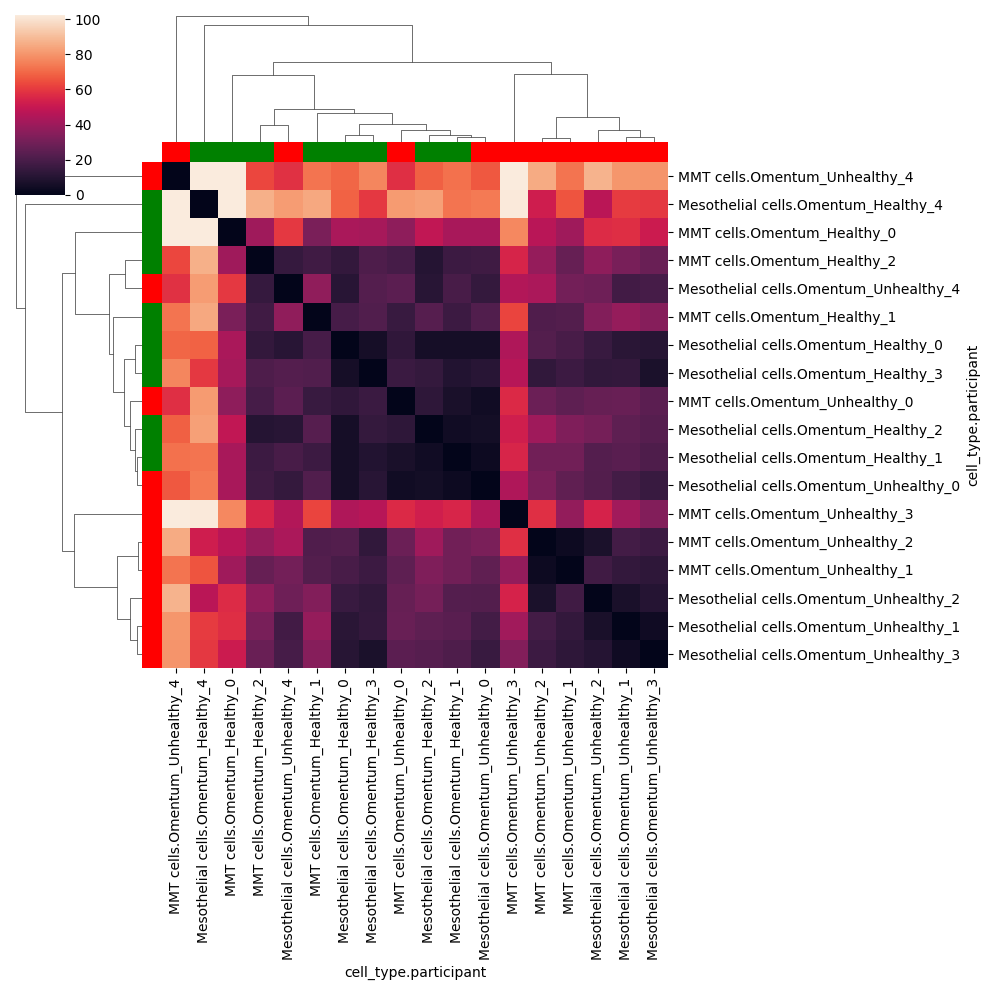

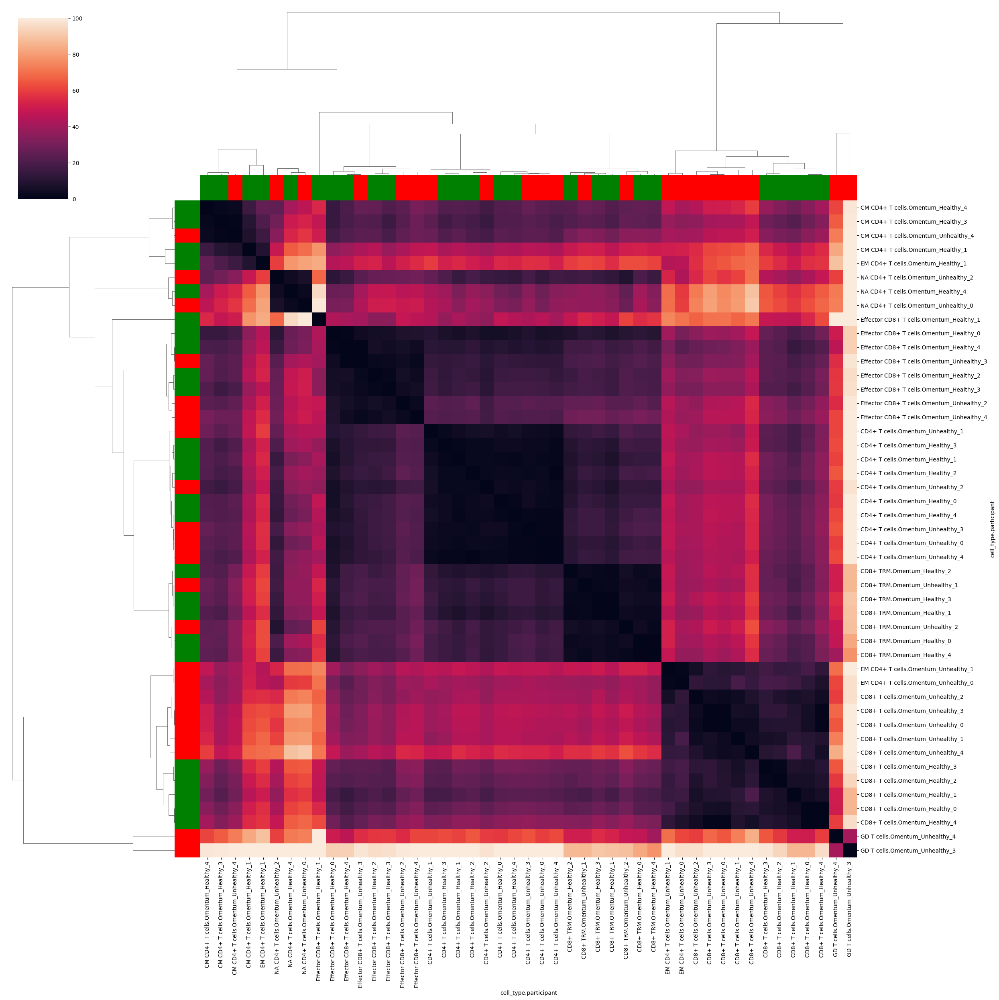

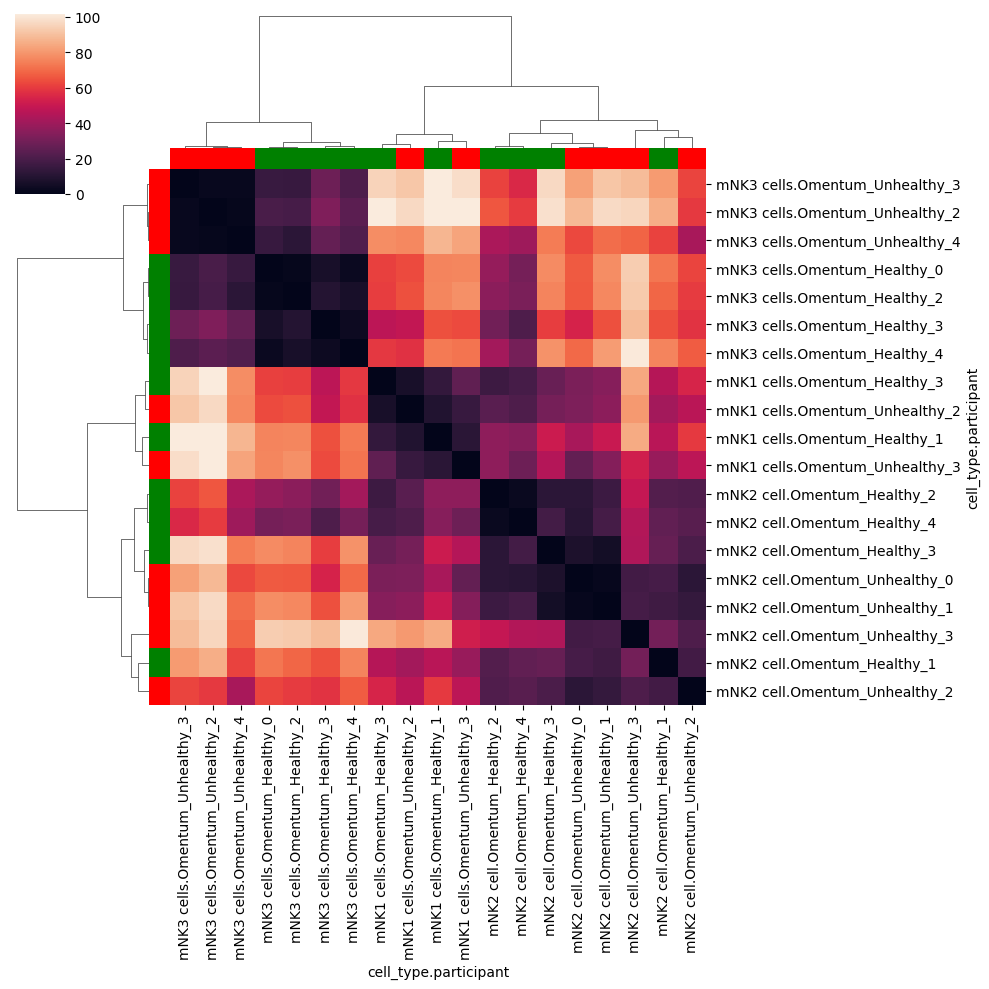

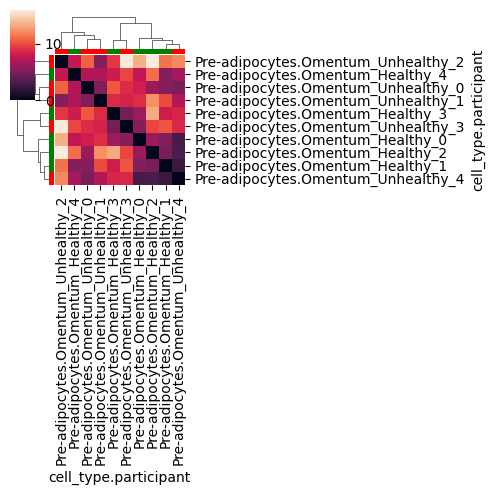

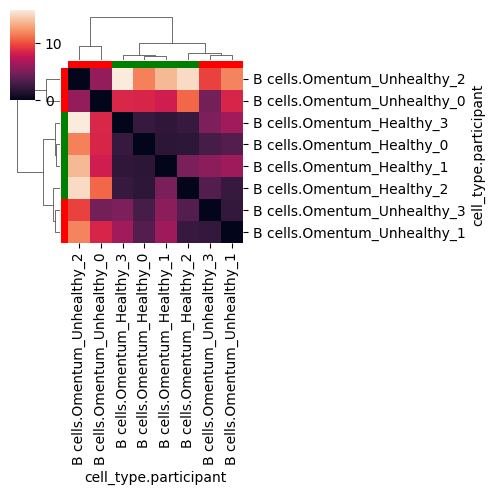

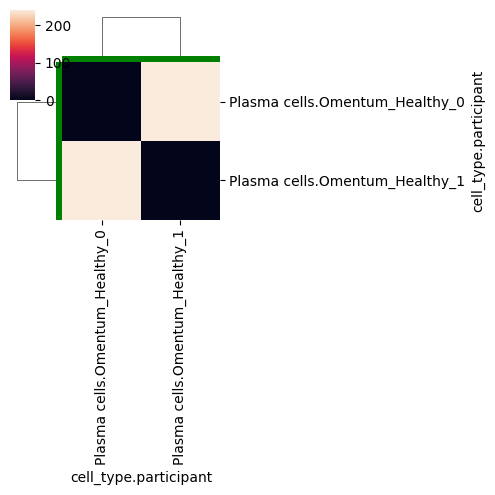

In [234]:
cell_type_col_out = "cell_type"

for ct in adata.obs[cell_type_col_out].unique():
    ct_subtypes_participants = adata.obs.loc[adata.obs[cell_type_col_out] == ct, obs_key].unique()

    idx = df.index[df.index.isin(ct_subtypes_participants)]    
    
    if not len(idx):
        continue

    df_ct = df.loc[idx, idx]

    n = int(len(idx) // 11) + 1
    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5*n, 5*n), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### Eucledian distance

In [235]:
distance = pt.tl.Distance("euclidean", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [236]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [237]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [238]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'pDCs.Omentum_Unhealthy_1', 'pDCs.Omentum_Unhealthy_2', 'pDCs.Omentum_Unhealthy_3', 'pDCs.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [239]:
df = (df + df.T) / 2

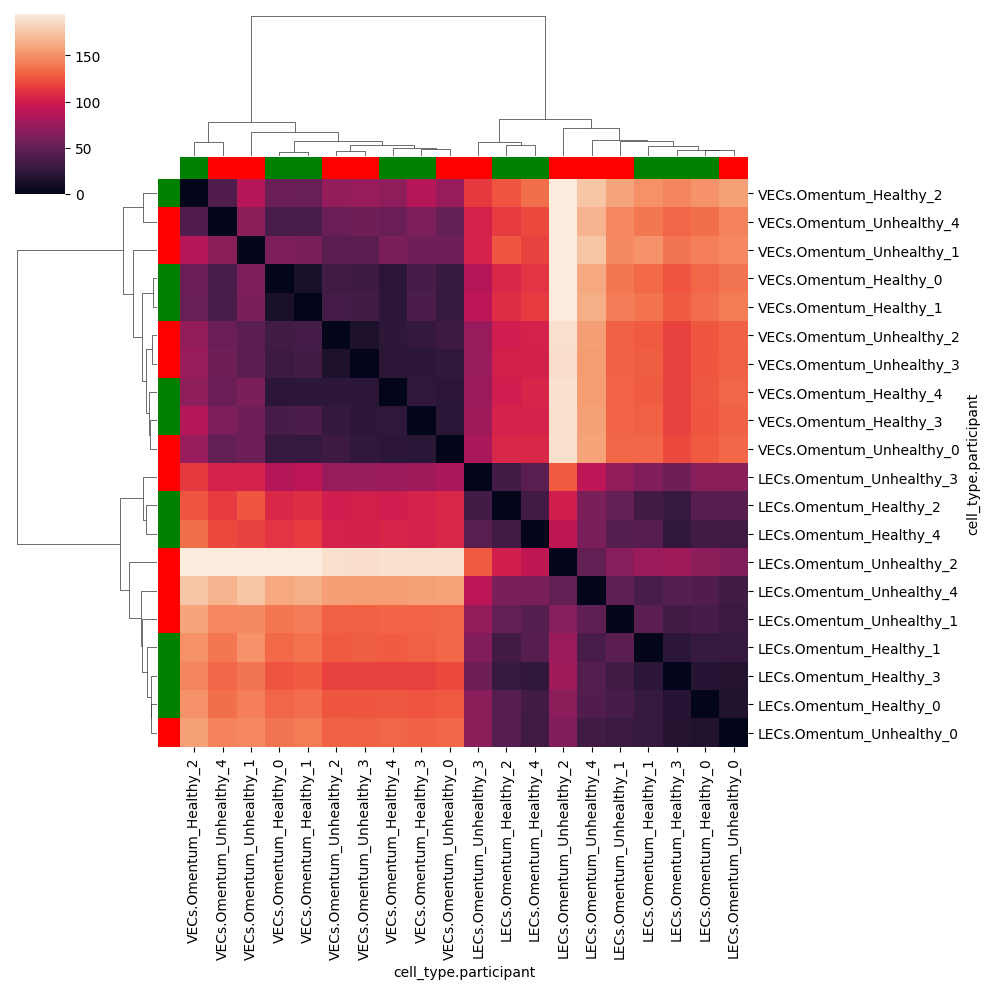

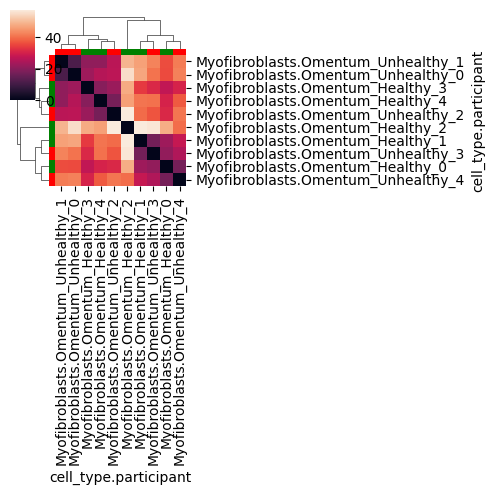

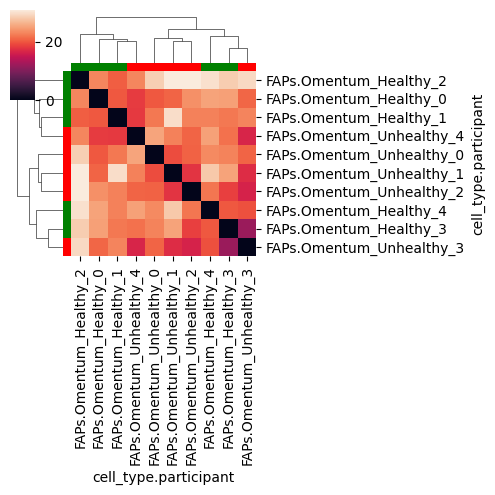

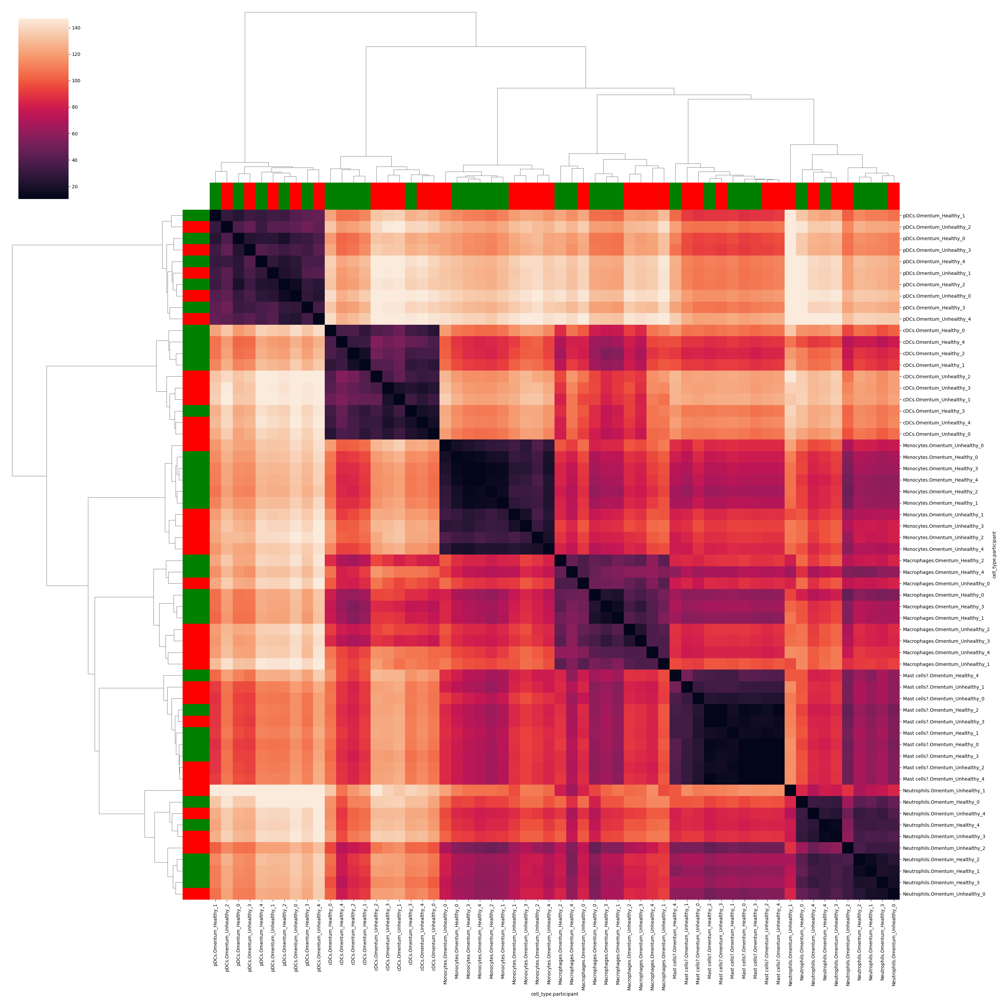

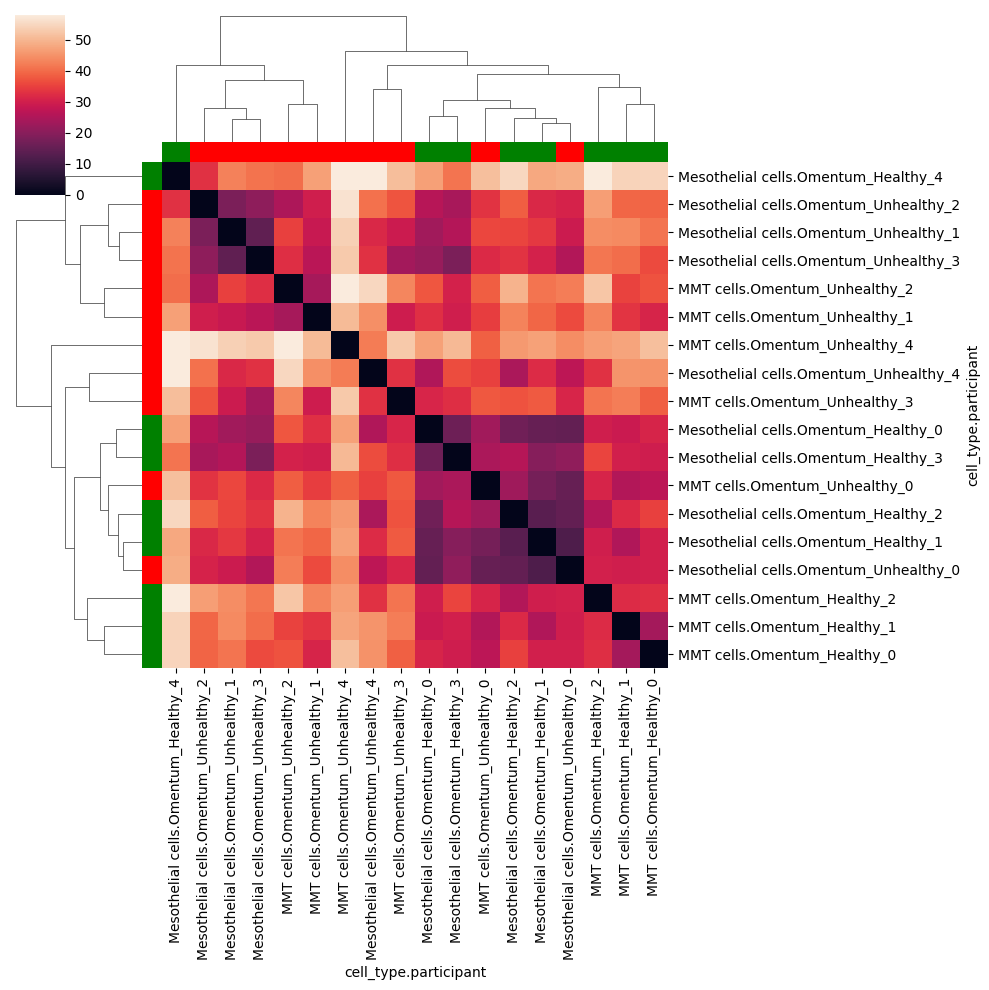

...

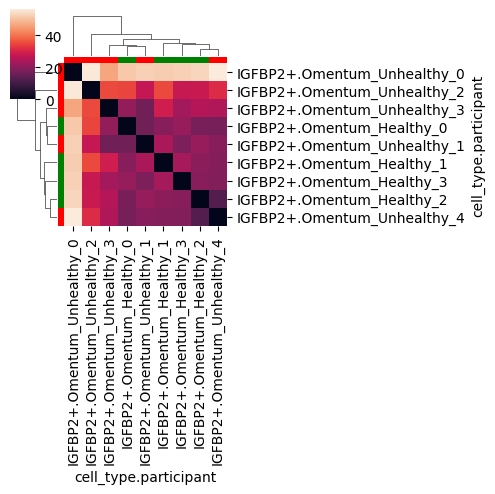

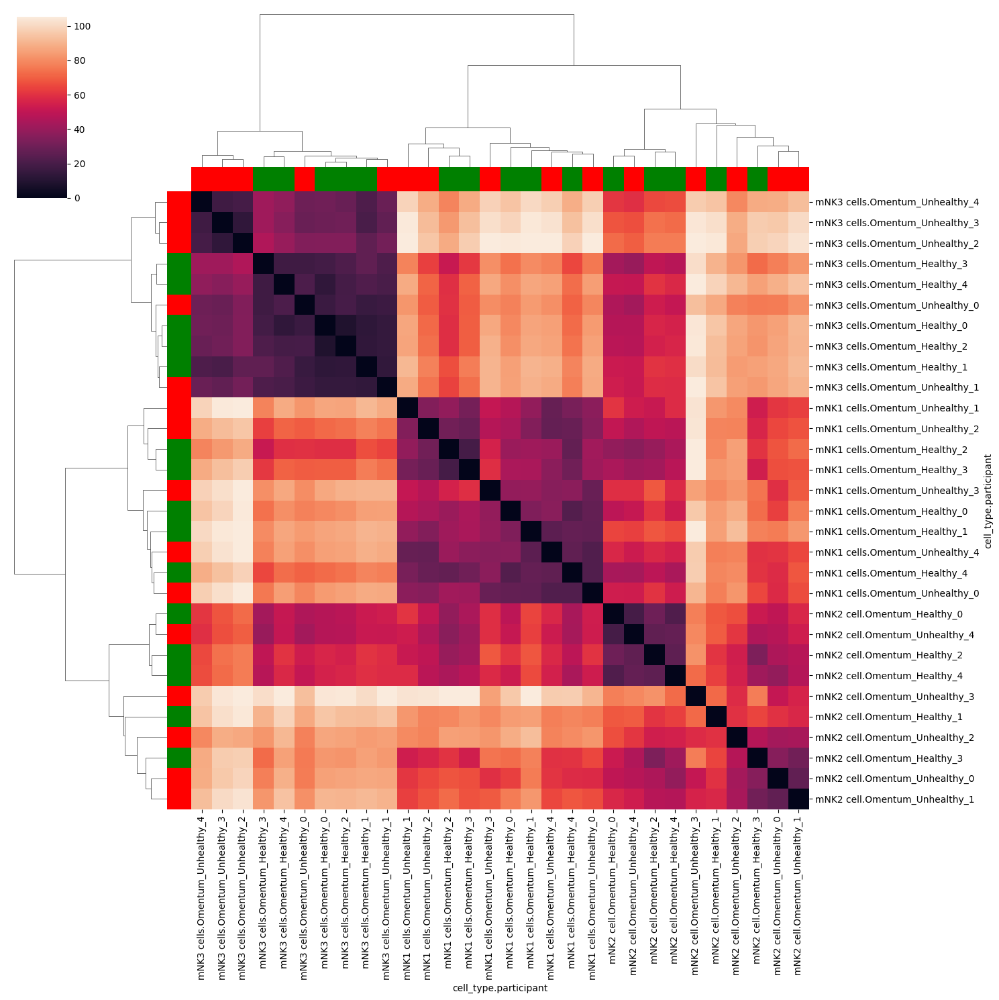

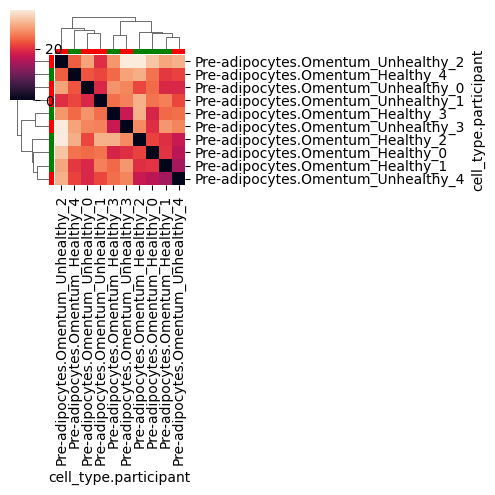

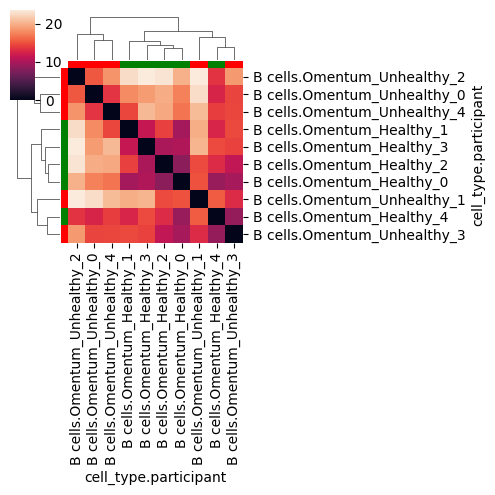

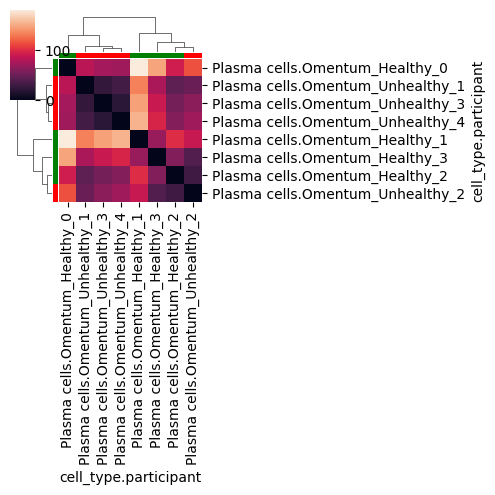

In [240]:
cell_type_col_out = "cell_type"

for ct in adata.obs[cell_type_col_out].unique():
    ct_subtypes_participants = adata.obs.loc[adata.obs[cell_type_col_out] == ct, obs_key].unique()

    idx = df.index[df.index.isin(ct_subtypes_participants)]    
    
    if not len(idx):
        continue

    df_ct = df.loc[idx, idx]

    n = int(len(idx) // 11) + 1
    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5*n, 5*n), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### Mean pairwise distance

In [241]:
distance = pt.tl.Distance("mean_pairwise", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

In [242]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [243]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [244]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'pDCs.Omentum_Unhealthy_1', 'pDCs.Omentum_Unhealthy_2', 'pDCs.Omentum_Unhealthy_3', 'pDCs.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [245]:
df = (df + df.T) / 2

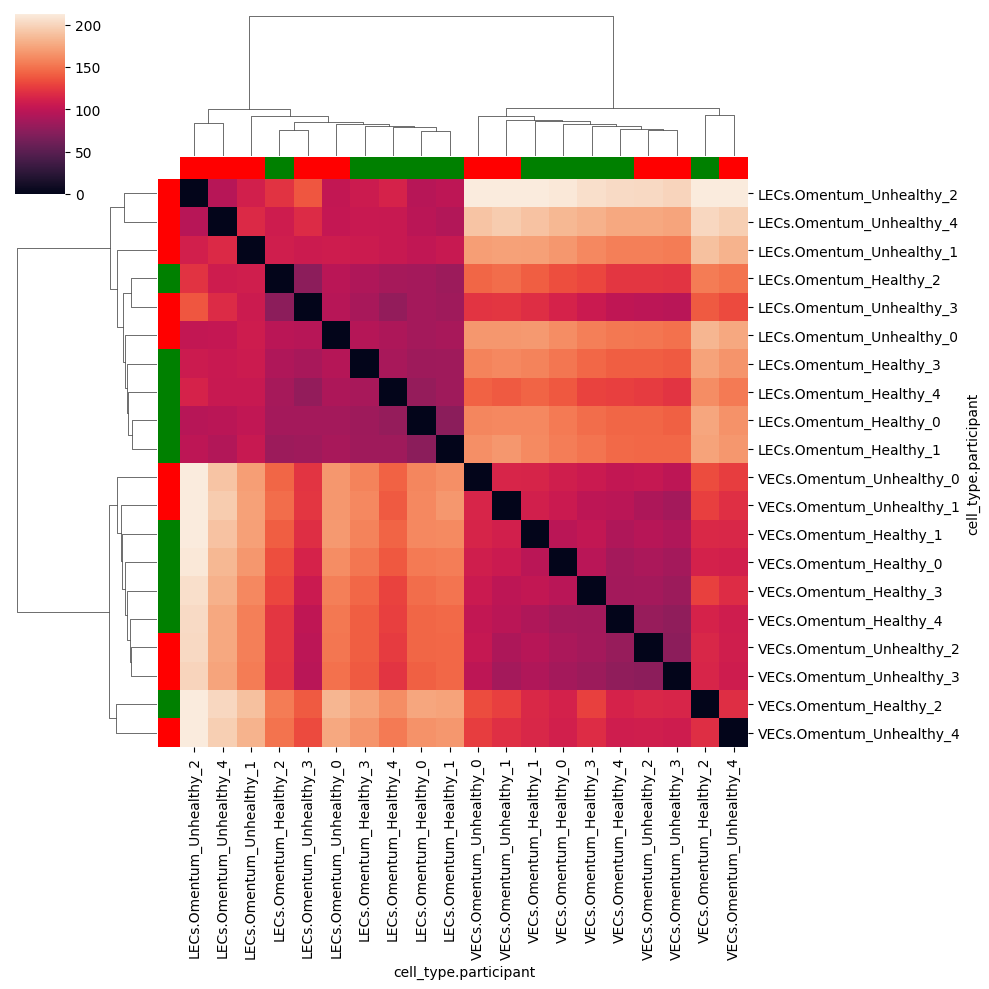

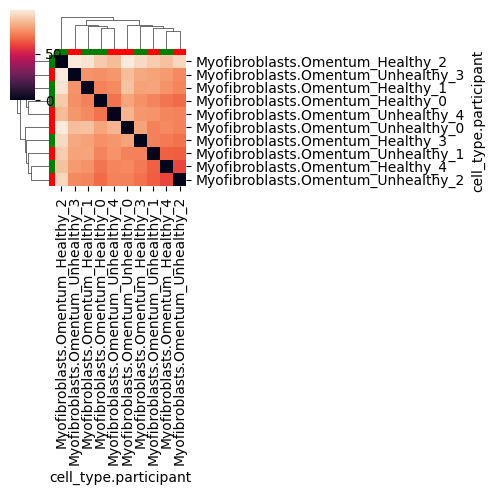

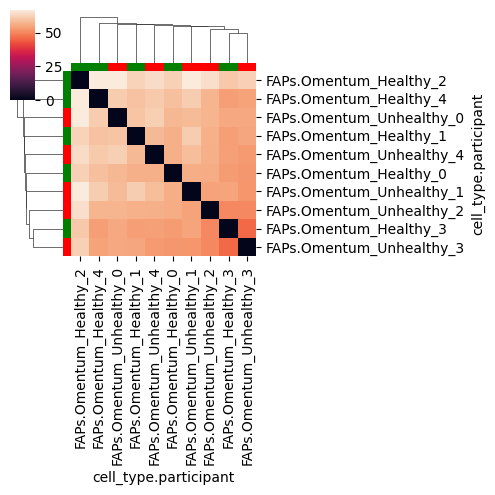

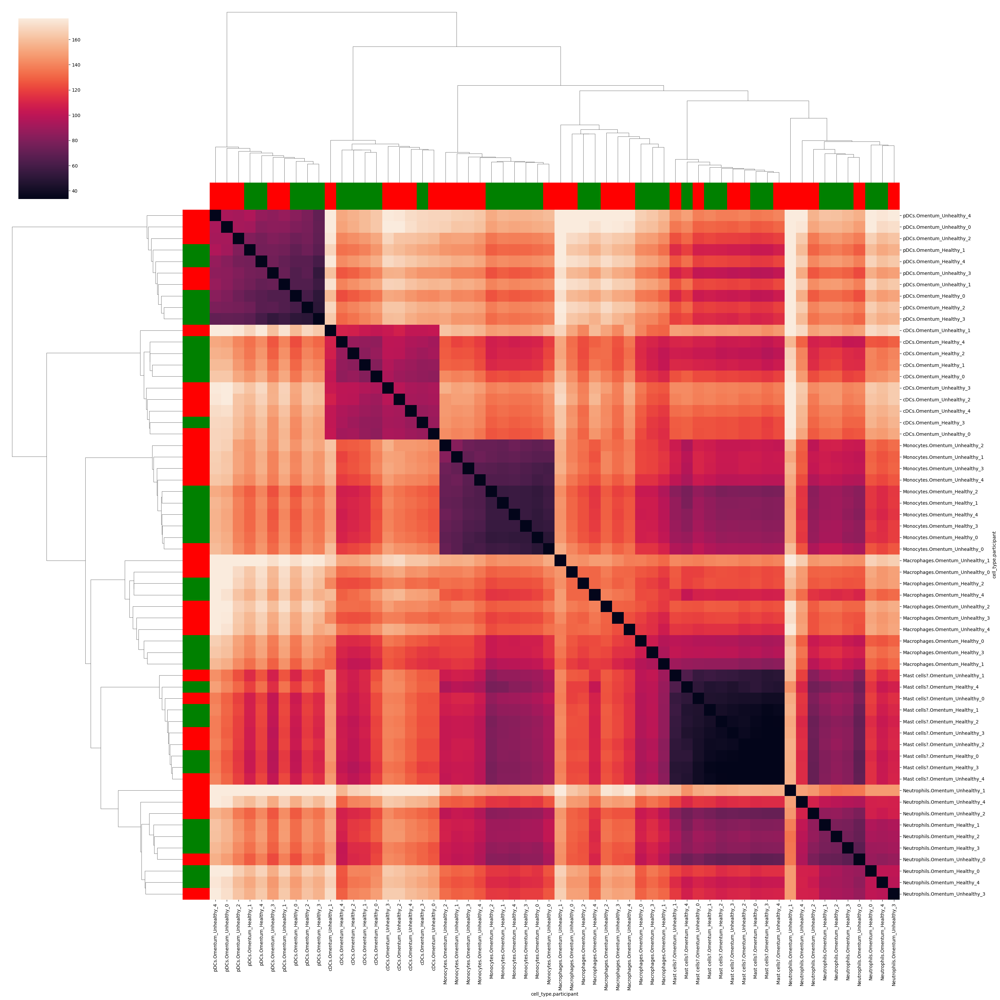

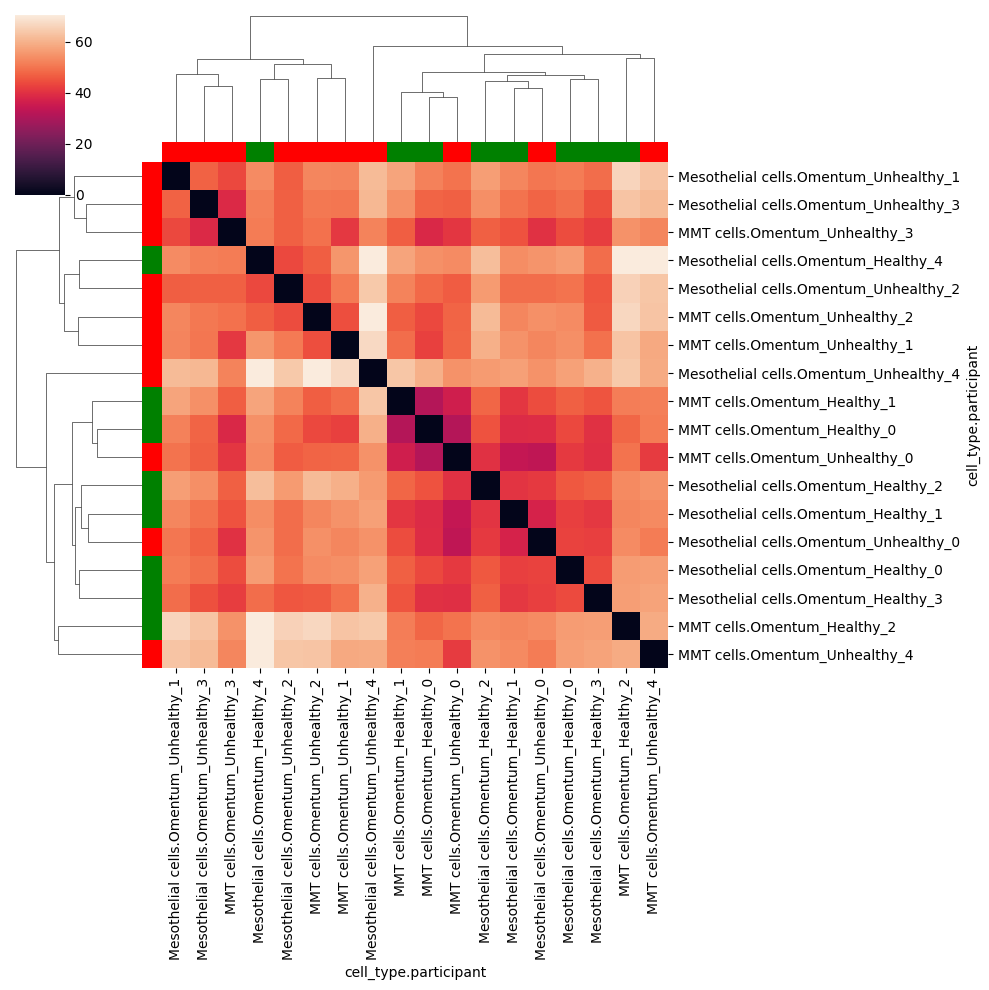

...

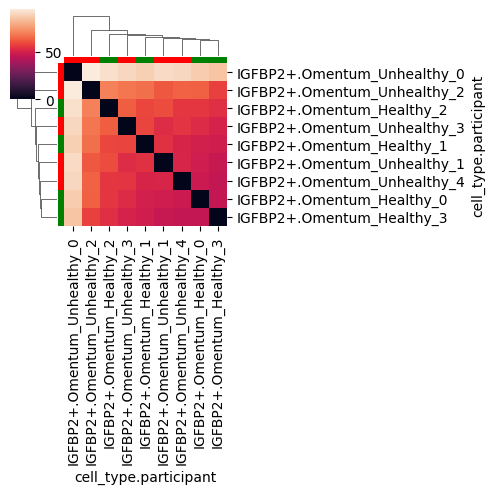

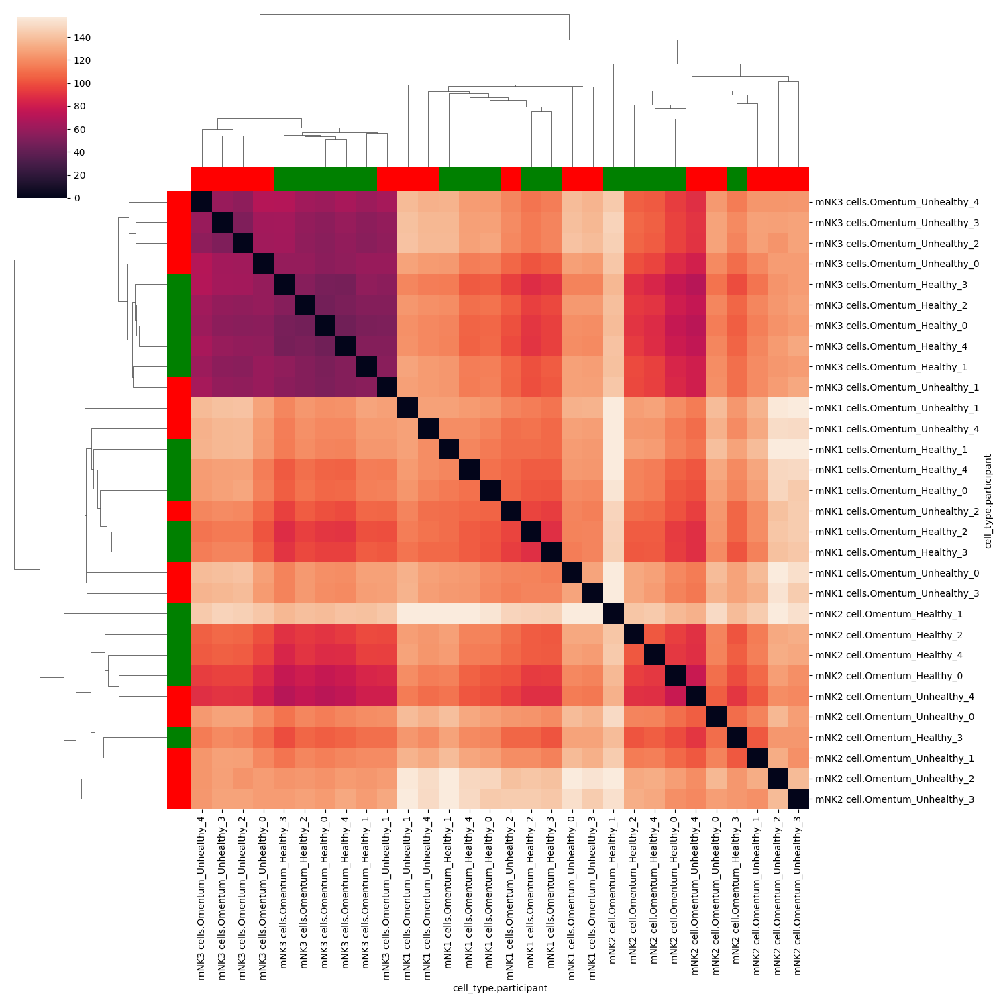

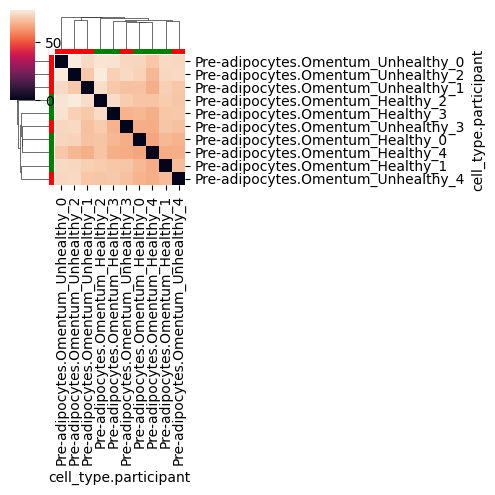

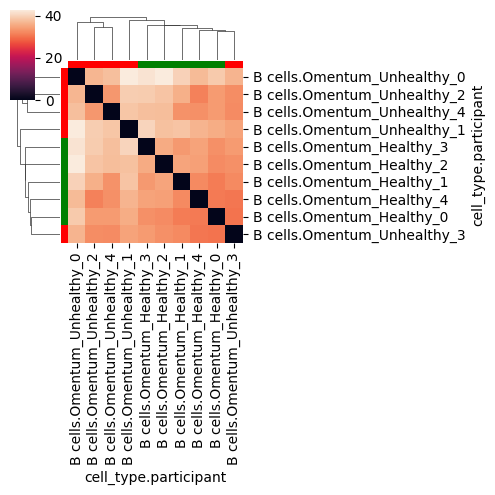

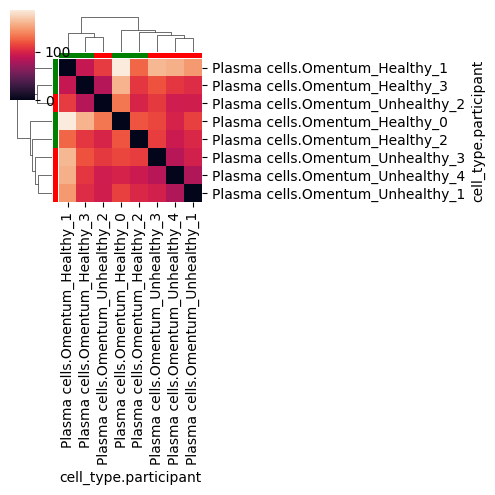

In [246]:
cell_type_col_out = "cell_type"

for ct in adata.obs[cell_type_col_out].unique():
    ct_subtypes_participants = adata.obs.loc[adata.obs[cell_type_col_out] == ct, obs_key].unique()

    idx = df.index[df.index.isin(ct_subtypes_participants)]    
    
    if not len(idx):
        continue

    df_ct = df.loc[idx, idx]

    n = int(len(idx) // 11) + 1
    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5*n, 5*n), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### MMD

In [248]:
distance = pt.tl.Distance("mmd", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

Output()

In [249]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [250]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [251]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'pDCs.Omentum_Unhealthy_1', 'pDCs.Omentum_Unhealthy_2', 'pDCs.Omentum_Unhealthy_3', 'pDCs.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [252]:
df = (df + df.T) / 2

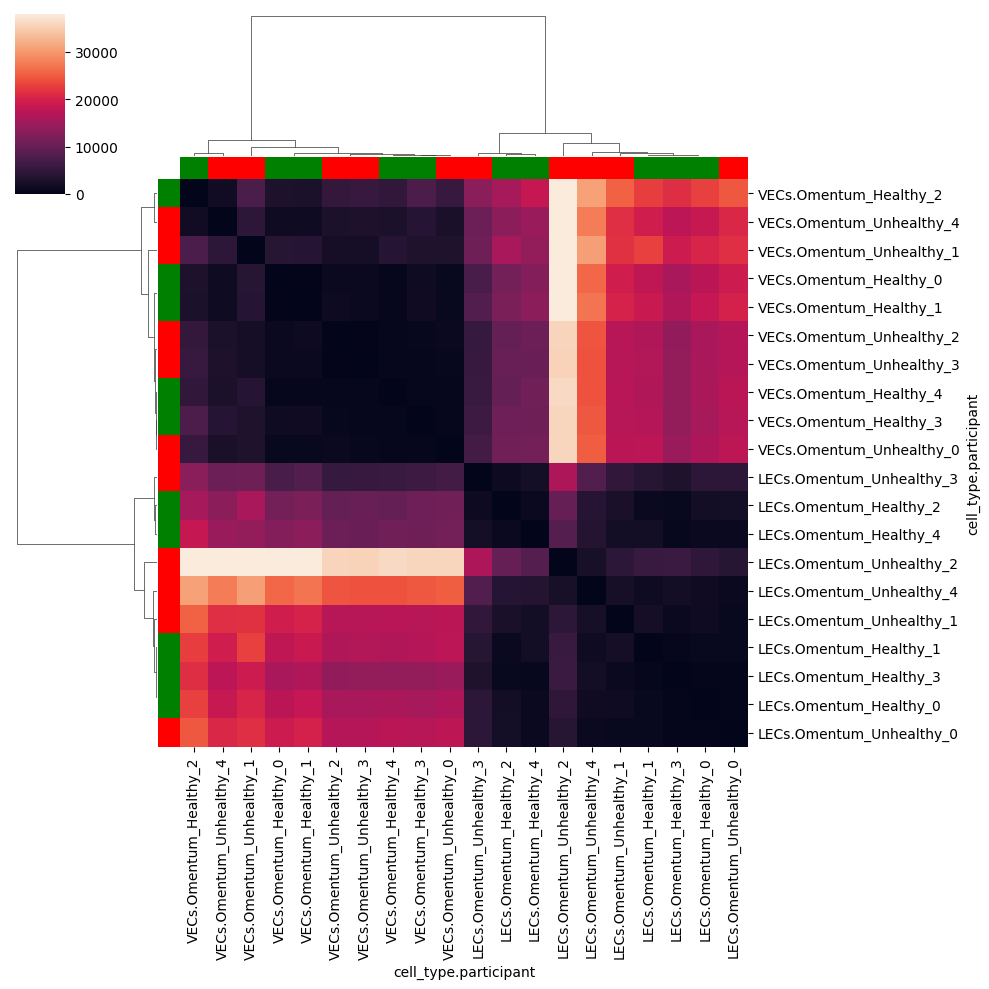

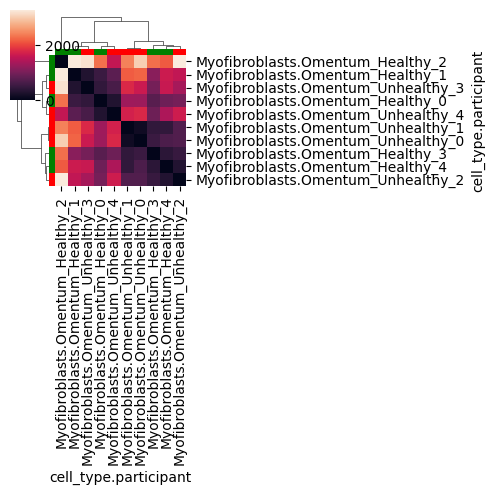

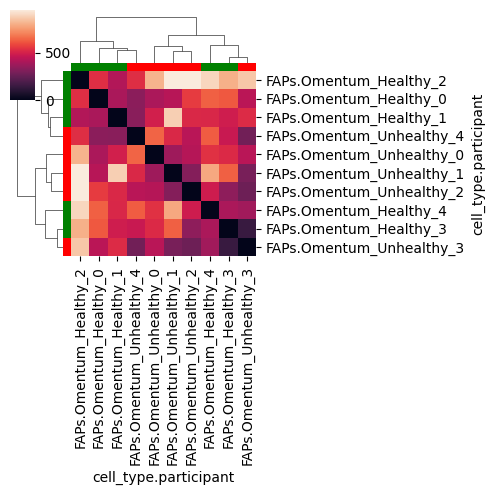

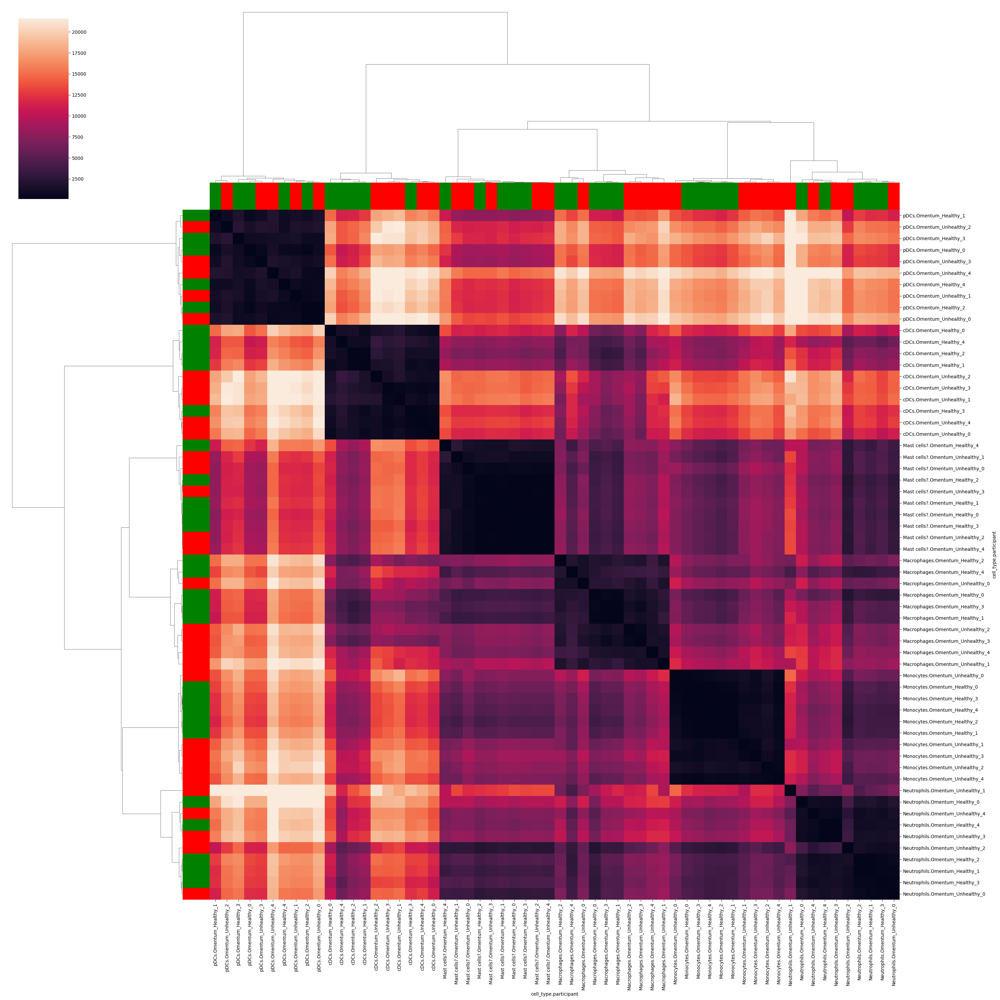

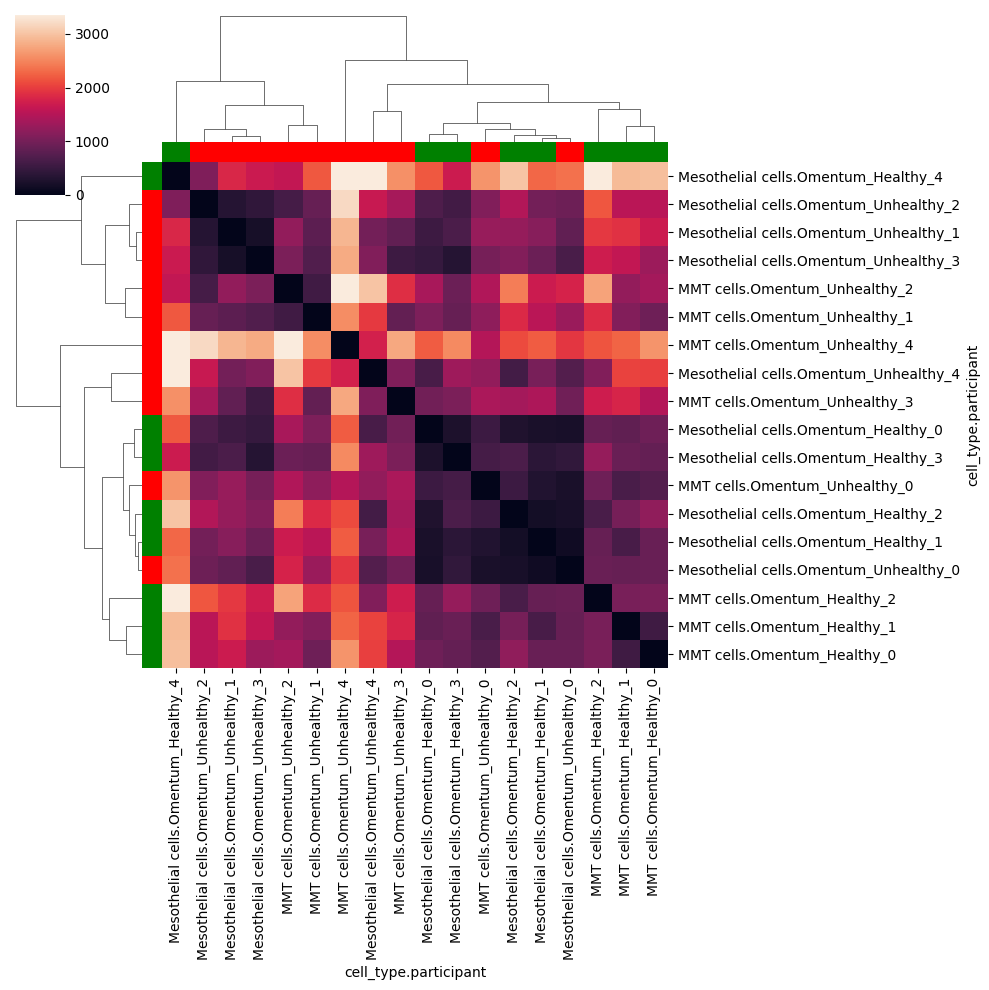

...

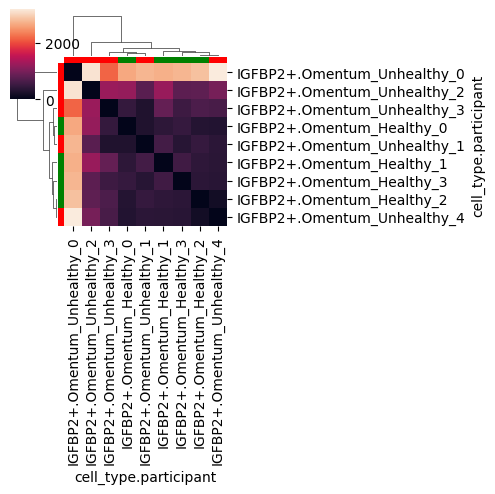

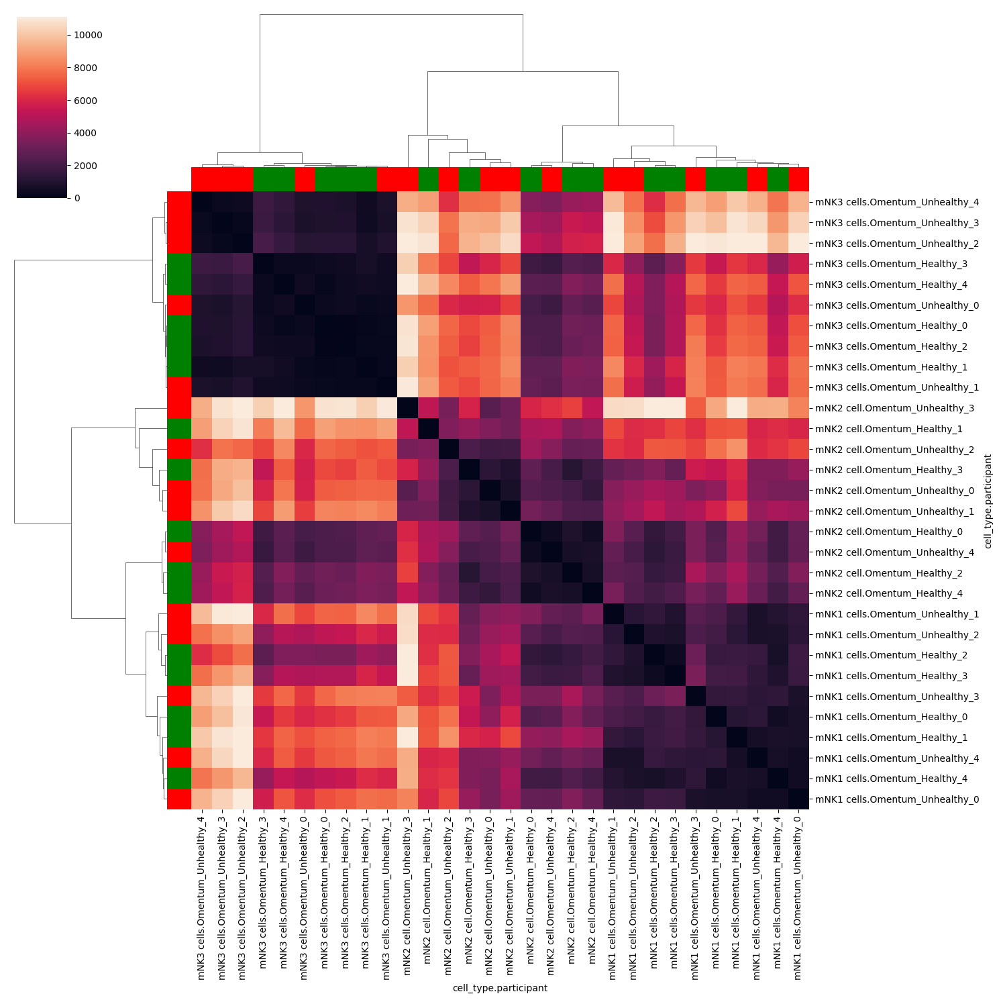

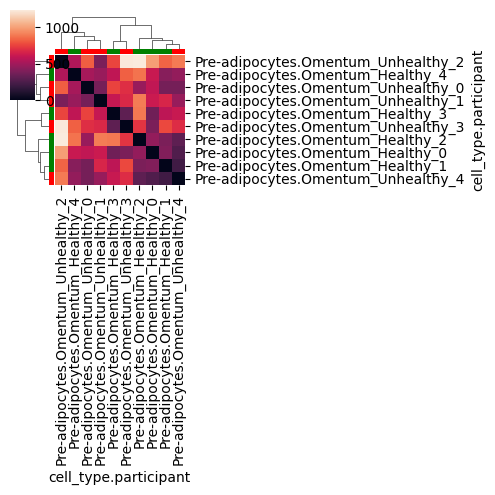

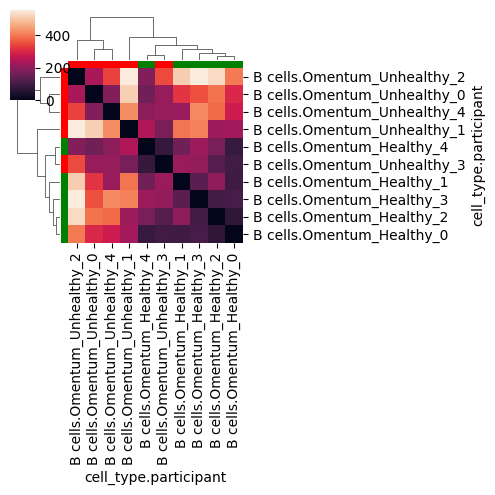

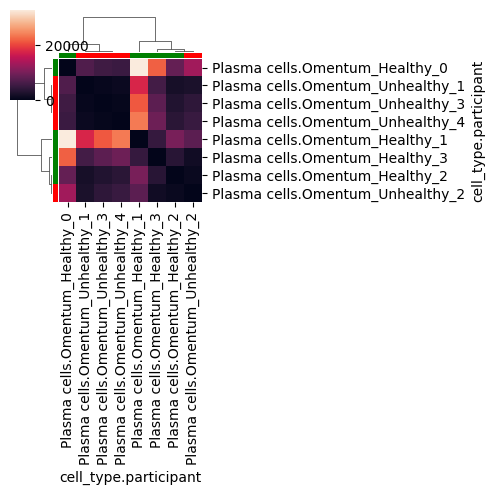

In [253]:
cell_type_col_out = "cell_type"

for ct in adata.obs[cell_type_col_out].unique():
    ct_subtypes_participants = adata.obs.loc[adata.obs[cell_type_col_out] == ct, obs_key].unique()

    idx = df.index[df.index.isin(ct_subtypes_participants)]    
    
    if not len(idx):
        continue

    df_ct = df.loc[idx, idx]

    n = int(len(idx) // 11) + 1
    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5*n, 5*n), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

### ks_test

In [254]:
distance = pt.tl.Distance("ks_test", obsm_key="X_pca")
df = distance.pairwise(adata, groupby=obs_key)

Output()

/opt/miniconda3/envs/rnaseq/lib/python3.13/site-packages/scipy/stats/_axis_nan_policy.py:430: RuntimeWarning: 
ks_2samp: Exact calculation unsuccessful. Switching to method=asymp.
  return hypotest_fun_in(*args, **kwds)

In [255]:
negatives = df.index[(df < 0).sum(axis=0).astype(bool)]

In [256]:
df.drop(negatives, axis=0, inplace=True)
df.drop(negatives, axis=1, inplace=True)

In [257]:
df.index[(df < 0).sum(axis=0).astype(bool)]

CategoricalIndex([], categories=['B cells.Omentum_Healthy_0', 'B cells.Omentum_Healthy_1', 'B cells.Omentum_Healthy_2', 'B cells.Omentum_Healthy_3', ..., 'pDCs.Omentum_Unhealthy_1', 'pDCs.Omentum_Unhealthy_2', 'pDCs.Omentum_Unhealthy_3', 'pDCs.Omentum_Unhealthy_4'], ordered=False, dtype='category', name='cell_type.participant')

In [258]:
df = (df + df.T) / 2

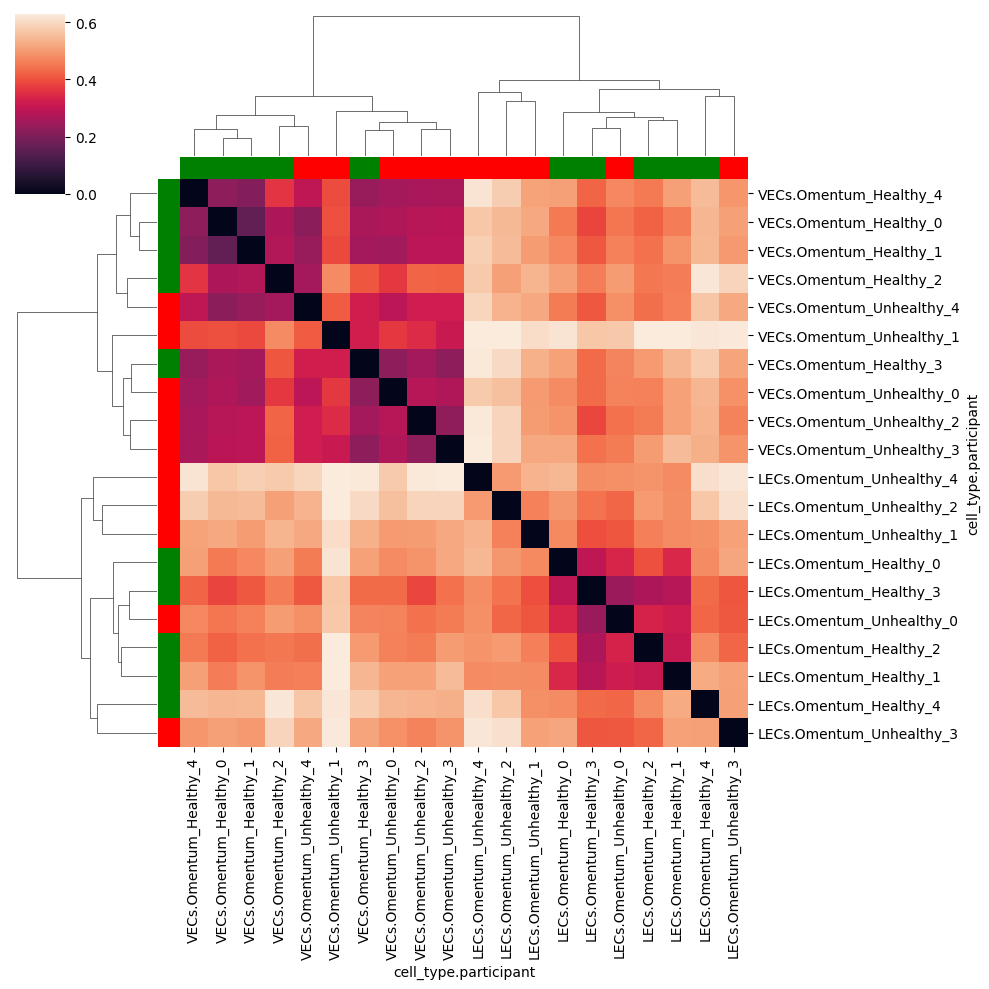

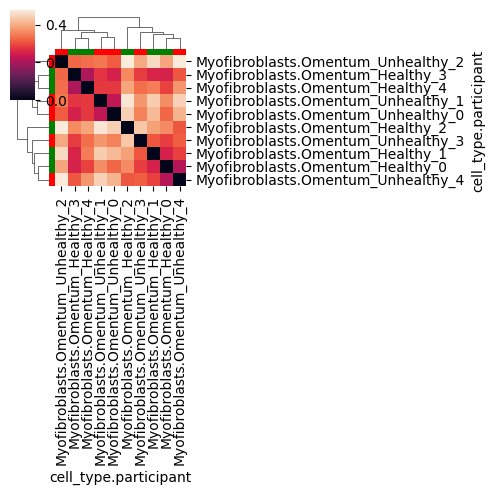

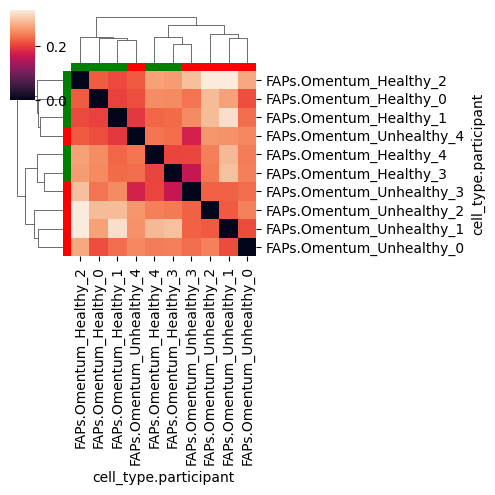

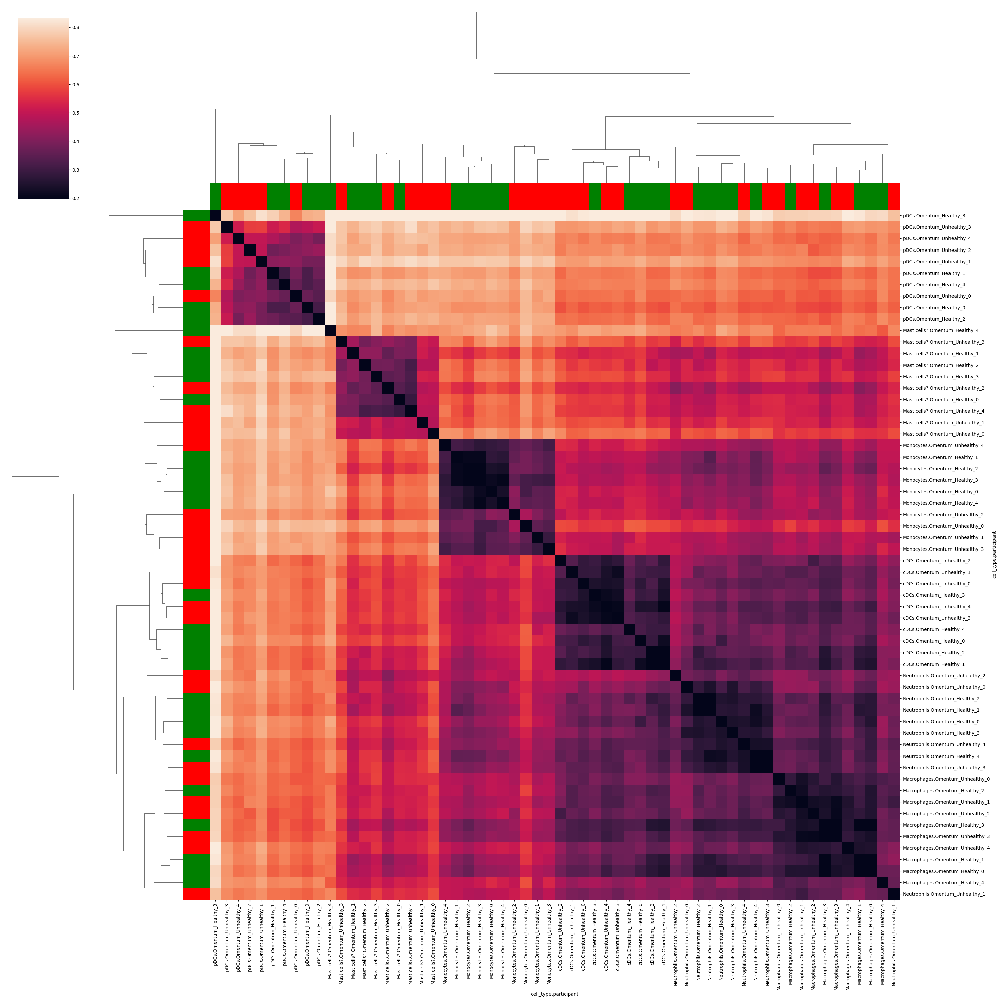

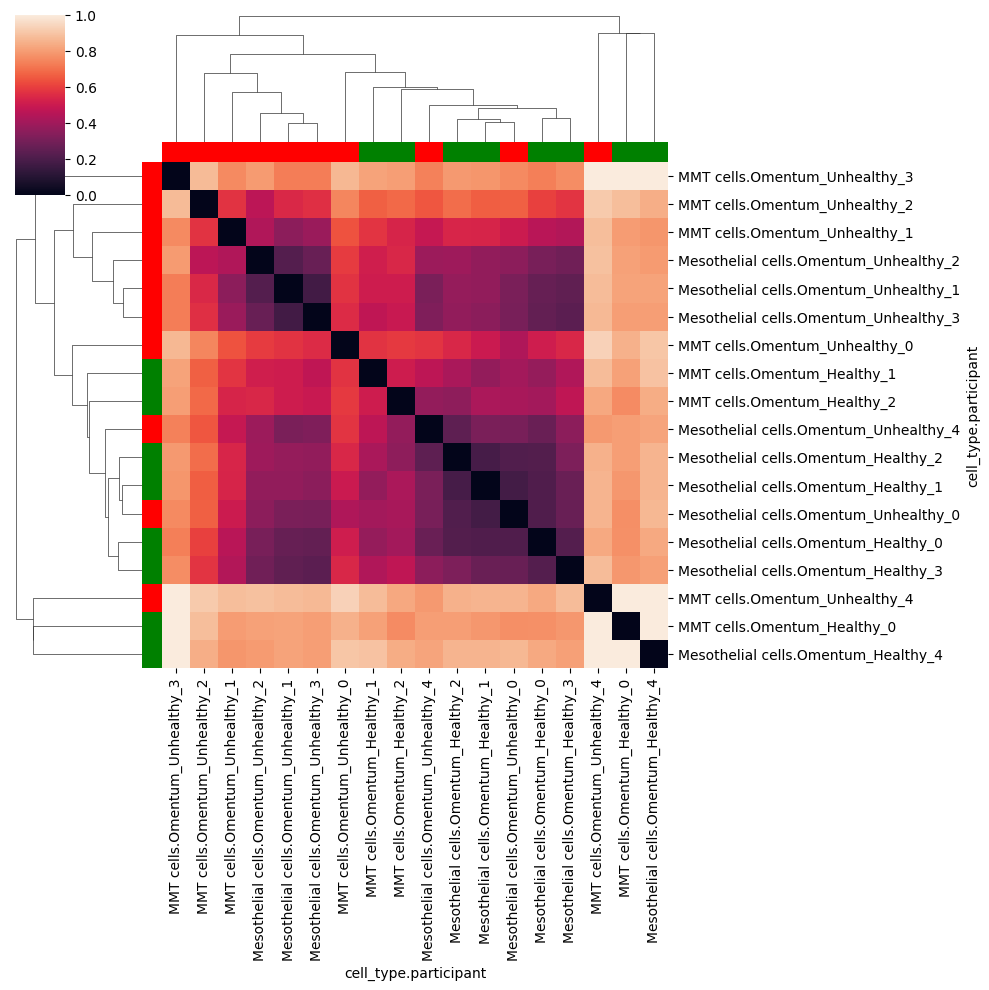

...

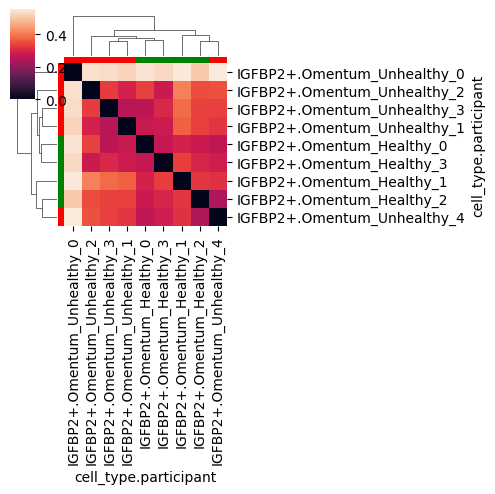

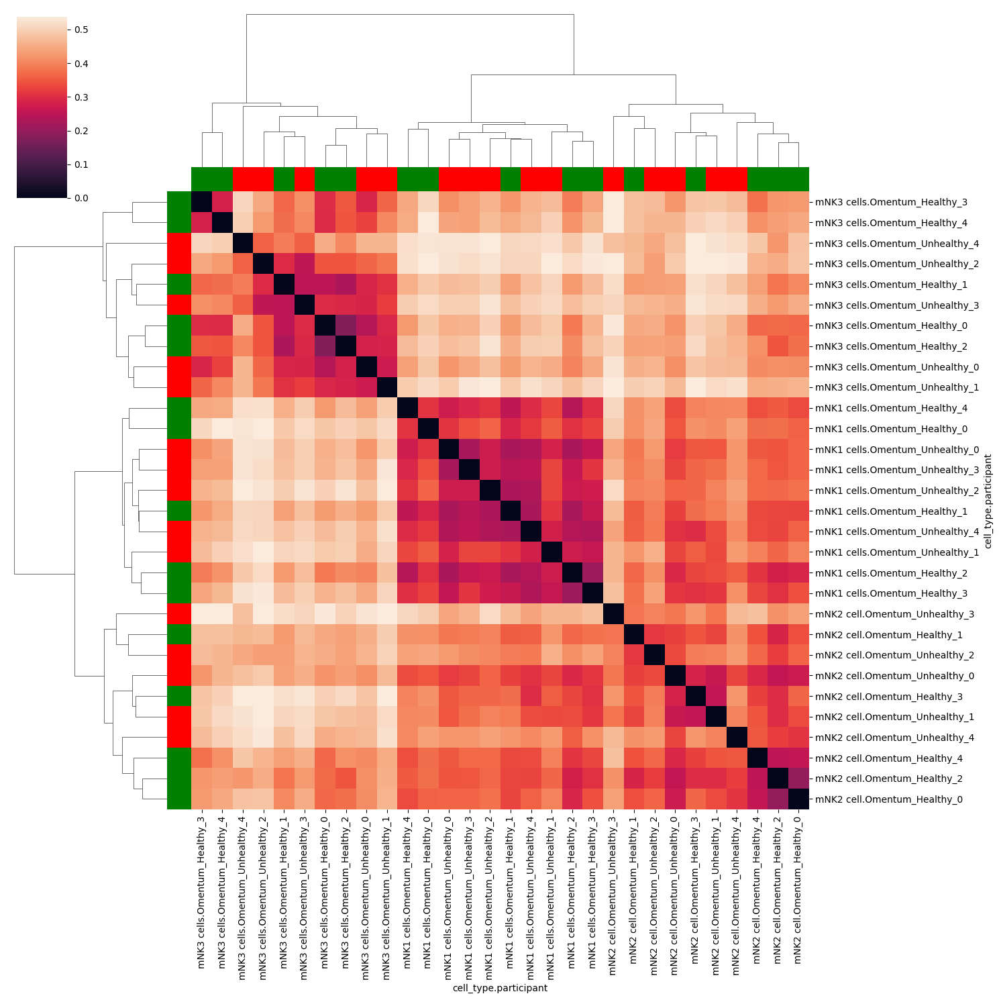

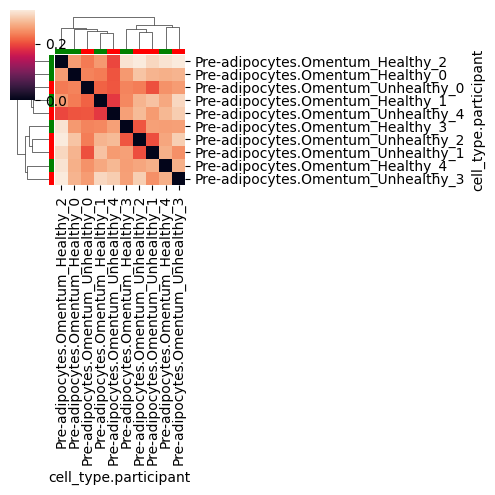

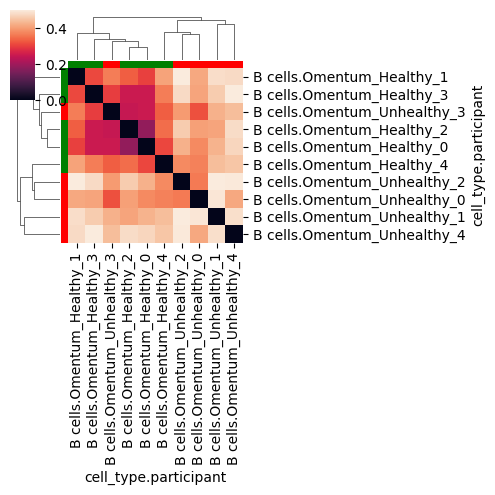

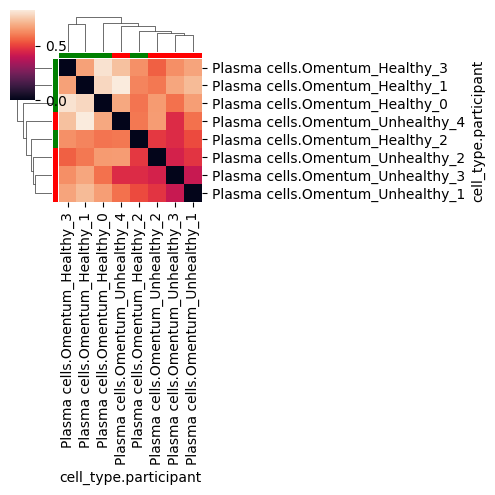

In [259]:
cell_type_col_out = "cell_type"

for ct in adata.obs[cell_type_col_out].unique():
    ct_subtypes_participants = adata.obs.loc[adata.obs[cell_type_col_out] == ct, obs_key].unique()

    idx = df.index[df.index.isin(ct_subtypes_participants)]    
    
    if not len(idx):
        continue

    df_ct = df.loc[idx, idx]

    n = int(len(idx) // 11) + 1
    condensed_matrix = squareform(df_ct)
    linkage_ = linkage(condensed_matrix, method='ward')

    lut = dict(zip(adata.obs.cohort.unique(), "gr"))
    row_colors = [lut[participant.split("_")[1]] for participant in df_ct.index]
    
    clustermap(df_ct, robust=True, figsize=(5*n, 5*n), row_colors=row_colors, col_colors=row_colors, row_linkage=linkage_, col_linkage=linkage_)
    plt.show()

# SubQ